<a href="https://colab.research.google.com/github/nissimlab/scRNA-seq-fixed-pancreas/blob/main/figures_plotting/GSE141017_Kras_all_clustering_annotations_ADMI_scoring.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#GSE141017 control, 17days Kras, 6weeks Kras, 3months Kras
#Sup Figure 8E
#Ran 20230406

## link Gdrive

In [ ]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


# Installing packages on Colab

In [ ]:
!pip install setuptools-scm install scanpy leidenalg watermark numpy==1.22.4 pandas==1.5.3 umap-learn==0.5.3 plotnine==0.8.0 anndata panel muon rpy2==3.4.5 anndata2ri triku ray harmonypy celltypist

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.8/43.8 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 29.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.0/103.0 kB 13.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 71.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.6/10.6 MB 80.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 11.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 90.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 291.5/291.5 kB 31.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.4/194.4 kB 24.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Prepari

In [ ]:
!sudo apt-get install -y libharfbuzz-dev libharfbuzz-dev libfribidi-dev libcairo2-dev

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  gir1.2-harfbuzz-0.0 libblkid-dev libcairo-script-interpreter2 libffi-dev
  libglib2.0-dev libglib2.0-dev-bin libgraphite2-dev libharfbuzz-gobject0
  libharfbuzz-icu0 liblzo2-2 libmount-dev libpixman-1-dev libselinux1-dev
  libsepol1-dev libxcb-render0-dev libxcb-shm0-dev
Suggested packages:
  libcairo2-doc libgirepository1.0-dev libglib2.0-doc libgdk-pixbuf2.0-bin
  | libgdk-pixbuf2.0-dev libxml2-utils libgraphite2-utils
The following NEW packages will be installed:
  gir1.2-harfbuzz-0.0 libblkid-dev libcairo-script-interpreter2 libcairo2-dev
  libffi-dev libfribidi-dev libglib2.0-dev libglib2.0-dev-bin libgraphite2-dev
  libharfbuzz-dev libharfbuzz-gobject0 libharfbuzz-icu0 liblzo2-2 libmount-dev
  libpixman-1-dev libselinux1-dev libsepol1-dev libxcb-render0-dev
  libxcb-shm0-dev
0 upgraded, 19 newly installed, 0 to remove and 24 not up

In [ ]:
!sudo apt-get update

Hit:1 http://archive.ubuntu.com/ubuntu focal InRelease
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  InRelease [1,581 B]
Get:3 http://security.ubuntu.com/ubuntu focal-security InRelease [114 kB]
Get:4 http://archive.ubuntu.com/ubuntu focal-updates InRelease [114 kB]
Hit:5 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu focal InRelease
Get:6 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  Packages [993 kB]
Hit:7 http://ppa.launchpad.net/cran/libgit2/ubuntu focal InRelease
Get:8 http://archive.ubuntu.com/ubuntu focal-backports InRelease [108 kB]
Hit:9 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu focal InRelease
Get:10 http://security.ubuntu.com/ubuntu focal-security/main amd64 Packages [2,629 kB]
Get:11 http://archive.ubuntu.com/ubuntu focal-updates/universe amd64 Packages [1,329 kB]
Hit:12 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu focal InRelease
Get:13 https://cloud.r-project.org/bin/linux/ubuntu focal-cr

In [ ]:
!sudo apt-get install msttcorefonts -qq

debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 17.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package libmspack0:amd64.
(Reading database ... 123233 files and directories currently installed.)
Preparing to unpack .../00-libmspack0_0.10.1-2_amd64.deb ...
Unpacking libmspack0:amd64 (0.10.1-2) ...
Selecting previously unselected package cabextract.
Preparing to unpack .../01-cabextract_1.9-3_amd64.deb ...
Unpacking cabextract (1.9-3) ...
Selecting previously unselected package libfontenc1:amd64.
Preparing to unpack .../02-libfontenc1_1%3a1.1.4-0ubuntu1_amd64.deb ...
Unpacking libfontenc1:amd64 (1:1.1.4-0ubun

In [ ]:
!sudo apt install font-manager

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  font-manager-common font-viewer
Suggested packages:
  file-roller nautilus-font-manager nemo-font-manager yelp
The following NEW packages will be installed:
  font-manager font-manager-common font-viewer
0 upgraded, 3 newly installed, 0 to remove and 30 not upgraded.
Need to get 1,740 kB of archives.
After this operation, 9,394 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal/universe amd64 font-manager-common amd64 0.7.7-0.3 [1,545 kB]
Get:2 http://archive.ubuntu.com/ubuntu focal/universe amd64 font-viewer amd64 0.7.7-0.3 [27.9 kB]
Get:3 http://archive.ubuntu.com/ubuntu focal/universe amd64 font-manager amd64 0.7.7-0.3 [168 kB]
Fetched 1,740 kB in 2s (838 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be 

In [ ]:
!pip install matplotlib==3.5.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.2/11.2 MB 78.9 MB/s eta 0:00:00
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.7.1
    Uninstalling matplotlib-3.7.1:
      Successfully uninstalled matplotlib-3.7.1


#Load font

In [ ]:
!rm ~/.cache/matplotlib -rf

In [ ]:
import matplotlib.font_manager as fm

In [ ]:
print(fm.findfont('Arial'))

/usr/share/fonts/truetype/msttcorefonts/Arial.ttf


## Import packages

If you want modules to be automatically reloaded when you call them, use `autoreload`:

In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
import scanpy as sc
import numpy as np
import re
import os
import pandas as pd
import seaborn as sb
import matplotlib
import scipy.sparse as sp
from scipy.sparse import issparse
import anndata2ri
import triku as tk
import re

import matplotlib as mpl
from scipy import stats as scistats
import matplotlib.pyplot as pl
import scanpy.external as sce
from matplotlib import colors
from pathlib import Path
from ipywidgets import interactive

import celltypist
from celltypist import models

import muon as mu
from muon import prot as pt

%matplotlib inline


In [ ]:
%pprint
import time
timestr = time.strftime("%d%m%Y-%H%M%S")
print(timestr)

Pretty printing has been turned OFF
20042023-180910


In [ ]:
# R integration
import anndata2ri
import logging
import rpy2.rinterface_lib.callbacks as rcb
import rpy2.robjects as ro
sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    frameon=False,
)

rcb.logger.setLevel(logging.ERROR)
ro.pandas2ri.activate()
anndata2ri.activate()

%load_ext rpy2.ipython

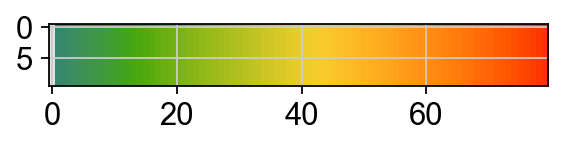

In [ ]:
import colorcet as cc

xs, _ = np.meshgrid(np.linspace(0, 1, 80), np.linspace(0, 1, 10))
colorsComb = np.vstack([pl.cm.Greys_r(np.linspace(0.8,0.1, 1)), cc.cm.rainbow_bgyr_35_85_c72(np.linspace(0.2,1, 100))])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)
pl.imshow(xs, cmap=mymap);  # use tab completion to choose

In [ ]:
%cd /content/

/content


In [ ]:
# add extra code to the path
!wget https://www.dropbox.com/s/xp4jrhczc0x4aa7/proportions.py
import sys
sys.path.append('/content/')
from proportions import show_values,plot_proportion_barplot_with_ncells

--2023-04-20 18:09:11--  https://www.dropbox.com/s/xp4jrhczc0x4aa7/proportions.py
Resolving www.dropbox.com (www.dropbox.com)... 162.125.85.18, 2620:100:6035:18::a27d:5512
Connecting to www.dropbox.com (www.dropbox.com)|162.125.85.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /s/raw/xp4jrhczc0x4aa7/proportions.py [following]
--2023-04-20 18:09:12--  https://www.dropbox.com/s/raw/xp4jrhczc0x4aa7/proportions.py
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc2596bfc1275f3ec026cae9f78b.dl.dropboxusercontent.com/cd/0/inline/B6hJlS1FfbSPK4oF3i41bMrn8DfGpKmX77dNYkju8fgzKAuUSAaDQR3J49sEvKxqEJFgVQMc_f_7oTo9Nb2xuFi6Uxs1jPiKZ9FSX9MIxbaS8JCw56JCIR7ci-fIERq_pwwEJvJfcoyqvrPEHJhnn4OS02w-WJtUJckFdMixcxXhVg/file# [following]
--2023-04-20 18:09:13--  https://uc2596bfc1275f3ec026cae9f78b.dl.dropboxusercontent.com/cd/0/inline/B6hJlS1FfbSPK4oF3i41bMrn8DfGpKmX77dNYkju8fgzKAuUSAaDQR3J49sEvKxqEJFgVQM

In [ ]:
from typing import Sequence, Optional
from anndata import AnnData

In [ ]:
import matplotlib.pyplot as plt

#Reproducibility

#Print package versions

In [ ]:
%load_ext watermark
%watermark
%watermark --iversions -v -m -p numpy,scipy,sklearn,anndata,scanpy,muon,anndata2ri,rpy2,triku

Last updated: 2023-04-20T18:09:16.017996+00:00

Python implementation: CPython
Python version       : 3.9.16
IPython version      : 7.34.0

Compiler    : GCC 9.4.0
OS          : Linux
Release     : 5.10.147+
Machine     : x86_64
Processor   : x86_64
CPU cores   : 8
Architecture: 64bit

Python implementation: CPython
Python version       : 3.9.16
IPython version      : 7.34.0

numpy     : 1.22.4
scipy     : 1.10.1
sklearn   : 1.2.2
anndata   : 0.9.1
scanpy    : 1.9.3
muon      : 0.1.3
anndata2ri: 1.1
rpy2      : 3.4.5
triku     : 2.1.6

Compiler    : GCC 9.4.0
OS          : Linux
Release     : 5.10.147+
Machine     : x86_64
Processor   : x86_64
CPU cores   : 8
Architecture: 64bit

celltypist  : 1.3.0
scanpy      : 1.9.3
matplotlib  : 3.5.0
re          : 2.2.1
anndata2ri  : 1.1
numpy       : 1.22.4
muon        : 0.1.3
session_info: 1.0.0
logging     : 0.5.1.2
anndata     : 0.9.1
pandas      : 1.3.0
colorcet    : 3.0.1
sys         : 3.9.16 (main, Dec  7 2022, 01:11:51) 
[GCC 9.4.0]
scipy 

## Set global parameters

Set some plotting parameters.

In [ ]:
sc._settings.ScanpyConfig.n_jobs=8

pl.rcParams['pdf.fonttype'] = 'truetype'
sc.set_figure_params(vector_friendly=False,dpi_save=300,transparent=True)
pl.rcParams['lines.linewidth'] = 0.1

Set other global parameters

In [ ]:
random_state=42
# should figures just be displayed or also saved?
save_figure = False

# should cashed values be used, or recompute?
force_recompute = False

In [ ]:
#@title load accesory funtions
#@markdown
"""Functions for downstream work with outputs of remove-background."""

import tables
import numpy as np
import scipy.sparse as sp
from typing import Dict


def dict_from_h5(file: str) -> Dict[str, np.ndarray]:
    """Read in everything from an h5 file and put into a dictionary."""
    d = {}
    with tables.open_file(file) as f:
        # read in everything
        for array in f.walk_nodes("/", "Array"):
            d[array.name] = array.read()
    return d


def anndata_from_h5(file: str,
                    analyzed_barcodes_only: bool = True) -> 'anndata.AnnData':
    """Load an output h5 file into an AnnData object for downstream work.

    Args:
        file: The h5 file
        analyzed_barcodes_only: False to load all barcodes, so that the size of
            the AnnData object will match the size of the input raw count matrix.
            True to load a limited set of barcodes: only those analyzed by the
            algorithm. This allows relevant latent variables to be loaded
            properly into adata.obs and adata.obsm, rather than adata.uns.

    Returns:
        adata: The anndata object, populated with inferred latent variables
            and metadata.

    """

    try:
        import anndata
    except ImportError:
        raise ImportError('The anndata package must be installed to use the '
                          'function anndata_from_h5()')

    d = dict_from_h5(file)
    X = sp.csc_matrix((d.pop('data'), d.pop('indices'), d.pop('indptr')),
                      shape=d.pop('shape')).transpose().tocsr()

    if analyzed_barcodes_only:
        if 'barcodes_analyzed_inds' in d.keys():
            X = X[d['barcodes_analyzed_inds'], :]
            d['barcodes'] = d['barcodes'][d['barcodes_analyzed_inds']]
        elif 'barcode_indices_for_latents' in d.keys():
            X = X[d['barcode_indices_for_latents'], :]
            d['barcodes'] = d['barcodes'][d['barcode_indices_for_latents']]
        else:
            print('Warning: analyzed_barcodes_only=True, but the key '
                  '"barcodes_analyzed_inds" or "barcode_indices_for_latents" '
                  'is missing from the h5 file. '
                  'Will output all barcodes, and proceed as if '
                  'analyzed_barcodes_only=False')

    # Construct the count matrix.
    adata = anndata.AnnData(X=X,
                            obs={'barcode': d.pop('barcodes').astype(str)},
                            var={'gene_name': (d.pop('gene_names') if 'gene_names' in d.keys()
                                               else d.pop('name')).astype(str)})
    adata.obs.set_index('barcode', inplace=True)
    adata.var.set_index('gene_name', inplace=True)

    # Add other information to the adata object in the appropriate slot.
    for key, value in d.items():
        try:
            value = np.asarray(value)
            if len(value.shape) == 0:
                adata.uns[key] = value
            elif value.shape[0] == X.shape[0]:
                if (len(value.shape) < 2) or (value.shape[1] < 2):
                    adata.obs[key] = value
                else:
                    adata.obsm[key] = value
            elif value.shape[0] == X.shape[1]:
                if value.dtype.name.startswith('bytes'):
                    adata.var[key] = value.astype(str)
                else:
                    adata.var[key] = value
            else:
                adata.uns[key] = value
        except Exception:
            print('Unable to load data into AnnData: ', key, value, type(value))

    if analyzed_barcodes_only:
        for col in adata.obs.columns[adata.obs.columns.str.startswith('barcodes_analyzed')
                                     | adata.obs.columns.str.startswith('barcode_indices')]:
            try:
                del adata.obs[col]
            except Exception:
                pass

    return adata


def load_anndata_from_input_and_output(input_file: str,
                                       output_file: str,
                                       analyzed_barcodes_only: bool = True,
                                       input_layer_key: str = 'cellranger') -> 'anndata.AnnData':
    """Load remove-background output count matrix into an anndata object,
    together with remove-background metadata and the raw input counts.

    Args:
        input_file: Raw h5 file used as input for remove-background.
        output_file: Output h5 file created by remove-background (can be
            filtered or not).
        analyzed_barcodes_only: Argument passed to anndata_from_h5().
            False to load all barcodes, so that the size of
            the AnnData object will match the size of the input raw count matrix.
            True to load a limited set of barcodes: only those analyzed by the
            algorithm. This allows relevant latent variables to be loaded
            properly into adata.obs and adata.obsm, rather than adata.uns.
        input_layer_key: Key of the anndata.layer that is created for the raw
            input count matrix.

    Return:
        adata_out: AnnData object with counts before and after remove-background,
            as well as inferred latent variables from remove-background.

    """

    # Load input data.
    adata_raw = anndata_from_h5(input_file, analyzed_barcodes_only=False)

    # Load remove-background output data.
    adata_out = anndata_from_h5(output_file, analyzed_barcodes_only=analyzed_barcodes_only)

    # Subset the raw dataset to the relevant barcodes.
    adata_raw = adata_raw[adata_out.obs.index]

    # Put count matrices into 'layers' in anndata for clarity.
    adata_out.layers[input_layer_key] = adata_raw.X.copy()
    adata_out.layers['cellbender'] = adata_out.X.copy()

    # Pre-compute a bit of metadata.
    adata_out.var['n_cellranger'] = np.array(adata_out.layers['cellranger'].sum(axis=0)).squeeze()
    adata_out.var['n_cellbender'] = np.array(adata_out.layers['cellbender'].sum(axis=0)).squeeze()

    return adata_out

# Setup WD

In [ ]:
folder='/content/drive/MyDrive/CellRanger_7_Data/Schlesinger_CR7/'

samplename='Schlesinger_all_v3'
random_state=42


import os
os.chdir(folder)
if not os.path.exists('./figures/'):
    os.makedirs('./figures/')

# import data as H5AD

In [ ]:
adata=sc.read(samplename+'_QCfilteredNormalized_Harmony_Triku_Neighbors_annotated_20230406.h5ad')

# Load Samples

In [ ]:
#controls

adata1=sc.read('/content/drive/MyDrive/CIP_v3_data/donors_h5ad/Schlesinger_E3_CR7_RawGeneFilter50_clean.h5ad')
adata2=sc.read('/content/drive/MyDrive/CIP_v3_data/donors_h5ad/Schlesinger_F3_CR7_RawGeneFilter50_clean.h5ad')
adata3=sc.read('/content/drive/MyDrive/CIP_v3_data/donors_h5ad/Schlesinger_G3_CR7_RawGeneFilter50_clean.h5ad')
adata4=sc.read('/content/drive/MyDrive/CIP_v3_data/donors_h5ad/Schlesinger_H3_CR7_RawGeneFilter50_clean.h5ad')
adata5=sc.read('/content/drive/MyDrive/CIP_v3_data/donors_h5ad/Schlesinger_Kras_3months_1_CR7_RawGeneFilter50_clean.h5ad')
adata6=sc.read('/content/drive/MyDrive/CIP_v3_data/donors_h5ad/Schlesinger_Kras_3months_2_CR7_RawGeneFilter50_clean.h5ad')
adata7=sc.read('/content/drive/MyDrive/CIP_v3_data/donors_h5ad/Schlesinger_Kras_17days_CR7_RawGeneFilter50_clean.h5ad')
adata8=sc.read('/content/drive/MyDrive/CIP_v3_data/donors_h5ad/Schlesinger_Kras_6weeks_CR7_RawGeneFilter50_clean.h5ad')


# rename several samples variables

In [ ]:
adata5.obs['donor'] = ['3months_1']*adata5.n_obs
adata6.obs['donor'] = ['3months_2']*adata6.n_obs
adata7.obs['donor'] = ['17days']*adata7.n_obs
adata8.obs['donor'] = ['6weeks']*adata8.n_obs

In [ ]:
#adjust for # of samples
adata = adata1.concatenate(adata2,adata3,adata4,adata5,adata6,adata7,adata8)
adata

AnnData object with n_obs × n_vars = 39627 × 32285
    obs: 'sample', 'condition', 'donor', 'date', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'batch'
    var: 'feature_type', 'id', 'mito', 'ambient_expression-0', 'n_cellranger-0', 'n_cellbender-0', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'ambient_expression-1', 'n_cellranger-1', 'n_cellbender-1', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 'ambient_expression-2', 'n_cellranger-2', 'n_cellbender-2', 'n_cells_by_counts-2', 'me

In [ ]:
print(adata.obs['sample'].value_counts())

Schlesinger    39627
Name: sample, dtype: int64


In [ ]:
print(adata.obs['condition'].value_counts())

Kras_3months    18263
Control          8429
Kras_17days      6547
Kras_6weeks      6388
Name: condition, dtype: int64


In [ ]:
print(adata.obs['donor'].value_counts())

3months_2    15322
17days        6547
6weeks        6388
3months_1     2941
S_1           2225
S_4           2188
S_2           2055
S_3           1961
Name: donor, dtype: int64


In [ ]:
adata.layers["counts"]=adata.X

Let's remove all genes expressed in fewer than 5 cells:

In [ ]:
sc.pp.filter_genes(adata, min_cells=5)
print('Number of genes after gene filter: {:d}'.format(adata.n_vars))

Number of genes after gene filter: 21907


In [ ]:
# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

# compute qc metrics

regex = re.compile('^(MT-).*', re.IGNORECASE)
mito_genes = [l for l in adata.var_names for m in [regex.search(l)] if m]
print('Found {} mito genes and annotated.'.format(len(mito_genes)))
adata.var['mt'] = False
adata.var.loc[mito_genes, 'mt'] = True


#adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
adata.var['rb'] = adata.var_names.str.startswith(('Rps','Rpl'))  # annotate the group of ribosomal proteins as 'rb'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(adata, qc_vars=['rb'], percent_top=None, log1p=False, inplace=True)

adata

Found 13 mito genes and annotated.


AnnData object with n_obs × n_vars = 39627 × 21907
    obs: 'sample', 'condition', 'donor', 'date', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'batch', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb'
    var: 'feature_type', 'id', 'mito', 'ambient_expression-0', 'n_cellranger-0', 'n_cellbender-0', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'ambient_expression-1', 'n_cellranger-1', 'n_cellbender-1', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 'ambient_expre

##deleting variables

In [ ]:
deletevar =['ambient_expression-0', 'n_cellranger-0', 'n_cellbender-0', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'ambient_expression-1', 'n_cellranger-1', 'n_cellbender-1', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 'ambient_expression-2', 'n_cellranger-2', 'n_cellbender-2', 'n_cells_by_counts-2', 'mean_counts-2', 'log1p_mean_counts-2', 'pct_dropout_by_counts-2', 'total_counts-2', 'log1p_total_counts-2', 'ambient_expression-3', 'n_cellranger-3', 'n_cellbender-3', 'n_cells_by_counts-3', 'mean_counts-3', 'log1p_mean_counts-3', 'pct_dropout_by_counts-3', 'total_counts-3', 'log1p_total_counts-3', 'ambient_expression-4', 'n_cellranger-4', 'n_cellbender-4', 'n_cells_by_counts-4', 'mean_counts-4', 'log1p_mean_counts-4', 'pct_dropout_by_counts-4', 'total_counts-4', 'log1p_total_counts-4', 'ambient_expression-5', 'n_cellranger-5', 'n_cellbender-5', 'n_cells_by_counts-5', 'mean_counts-5', 'log1p_mean_counts-5', 'pct_dropout_by_counts-5', 'total_counts-5', 'log1p_total_counts-5', 'ambient_expression-6', 'n_cellranger-6', 'n_cellbender-6', 'n_cells_by_counts-6', 'mean_counts-6', 'log1p_mean_counts-6', 'pct_dropout_by_counts-6', 'total_counts-6', 'log1p_total_counts-6', 'ambient_expression-7', 'n_cellranger-7', 'n_cellbender-7', 'n_cells_by_counts-7', 'mean_counts-7', 'log1p_mean_counts-7', 'pct_dropout_by_counts-7', 'total_counts-7', 'log1p_total_counts-7']
for x in deletevar:
  del adata.var[x]

In [ ]:
adata

AnnData object with n_obs × n_vars = 39627 × 21907
    obs: 'sample', 'condition', 'donor', 'date', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'batch', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb'
    var: 'feature_type', 'id', 'mito', 'n_cells', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'cellbender', 'cellranger', 'counts'

# reorder categories for plotting

In [ ]:
adata.obs['donor'].cat.categories

Index(['3months_1', '3months_2', '6weeks', '17days', 'S_1', 'S_2', 'S_3',
       'S_4'],
      dtype='object')

In [ ]:
adata.obs['condition'].cat.categories

Index(['Control', 'Kras_3months', 'Kras_6weeks', 'Kras_17days'], dtype='object')

In [ ]:
adata.obs['donor']= adata.obs['donor'].cat.reorder_categories(['S_1', 'S_2', 'S_3', 'S_4','17days','6weeks','3months_1','3months_2'])

In [ ]:
adata.obs['condition']= adata.obs['condition'].cat.reorder_categories(['Control','Kras_17days','Kras_6weeks', 'Kras_3months'])

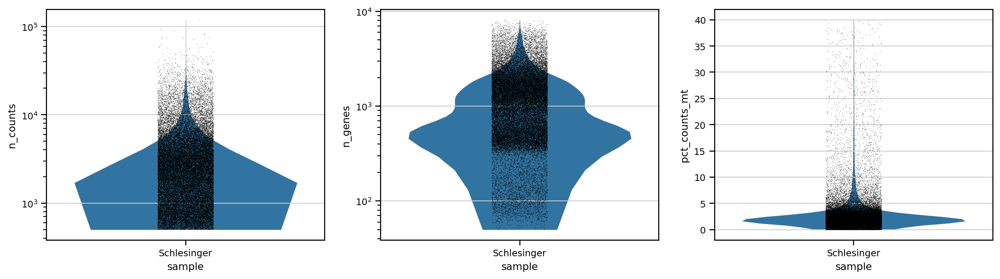

In [ ]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4), gridspec_kw={'wspace':0.2})

ax1_dict = sc.pl.violin(adata, 'n_counts', groupby='sample', size=0.5, log=True, cut=0, ax=ax1, show=False)
ax2_dict =  sc.pl.violin(adata, 'n_genes', groupby='sample', size=0.5, log=True, cut=0, ax=ax2, show=False)
ax3_dict = sc.pl.violin(adata, 'pct_counts_mt', groupby='sample',size=0.5, ax=ax3, show=False,)


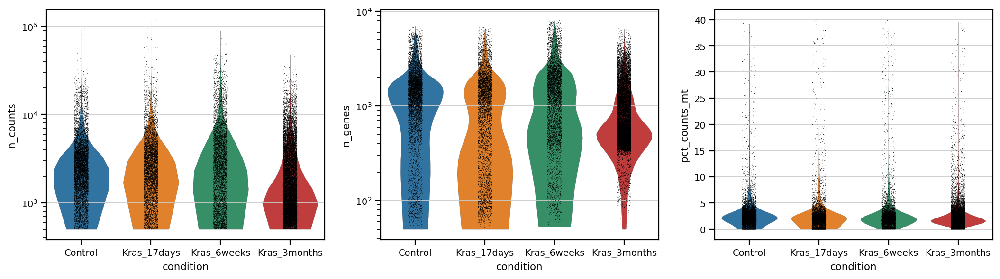

In [ ]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4), gridspec_kw={'wspace':0.2})

ax1_dict = sc.pl.violin(adata, 'n_counts', groupby='condition', size=0.5, log=True, cut=0, ax=ax1, show=False)
ax2_dict =  sc.pl.violin(adata, 'n_genes', groupby='condition', size=0.5, log=True, cut=0, ax=ax2, show=False)
ax3_dict = sc.pl.violin(adata, 'pct_counts_mt', groupby='condition',size=0.5, ax=ax3, show=False,)


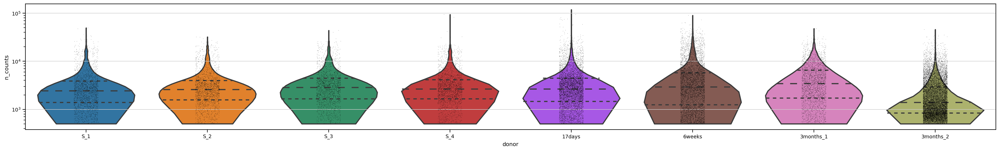

In [ ]:
#nCounts
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1) = plt.subplots(1, 1, figsize=(30,4), gridspec_kw={'wspace':0.5
                                                            })

ax1_dict = sc.pl.violin(adata, 'n_counts', groupby='donor', jitter=0.1, linewidth=2, alpha=0.25, inner="quartile", size=0.5, log=True, cut=0, ax=ax1, show=False)


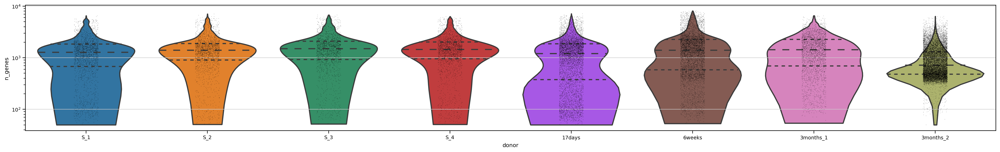

In [ ]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1) = plt.subplots(1, 1, figsize=(30,4), gridspec_kw={'wspace':0.2})

ax1_dict =  sc.pl.violin(adata, 'n_genes', groupby='donor',jitter=0.1, linewidth=2, alpha=0.25, inner="quartile", size=0.5, log=True, cut=0, ax=ax1, show=False)


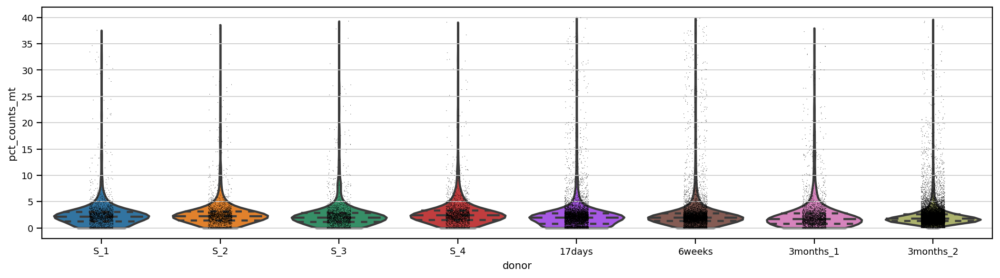

In [ ]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1) = plt.subplots(1, 1, figsize=(16,4), gridspec_kw={'wspace':0.2})

ax1_dict = sc.pl.violin(adata, 'pct_counts_mt',jitter=0.1, linewidth=2, alpha=0.25, inner="quartile", groupby='donor',size=0.5, ax=ax1, show=False,)


Let's show those genes that yield the highest fraction of counts in each single cell, across all cells.

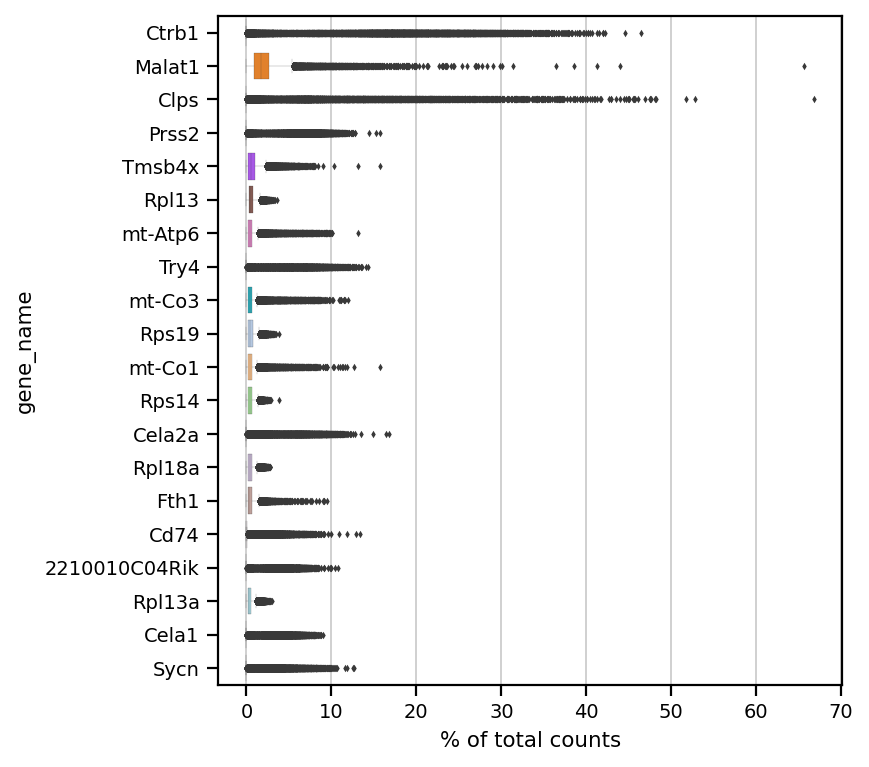

In [ ]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
savefig='_'+samplename + '_6_QC_highest_expr_genes.pdf'
sc.pl.highest_expr_genes(adata, n_top=20,save=savefig,)

#Initial QC Filtering doublet removal

In [ ]:
print(f"Total number of cells: {adata.n_obs}")
adata = adata[adata.obs.scDblFinder_class == "singlet"].copy()

print(f"Number of cells after filtering of doublets: {adata.n_obs}")

Total number of cells: 39627
Number of cells after filtering of doublets: 36165


# Quality control and pre-processing

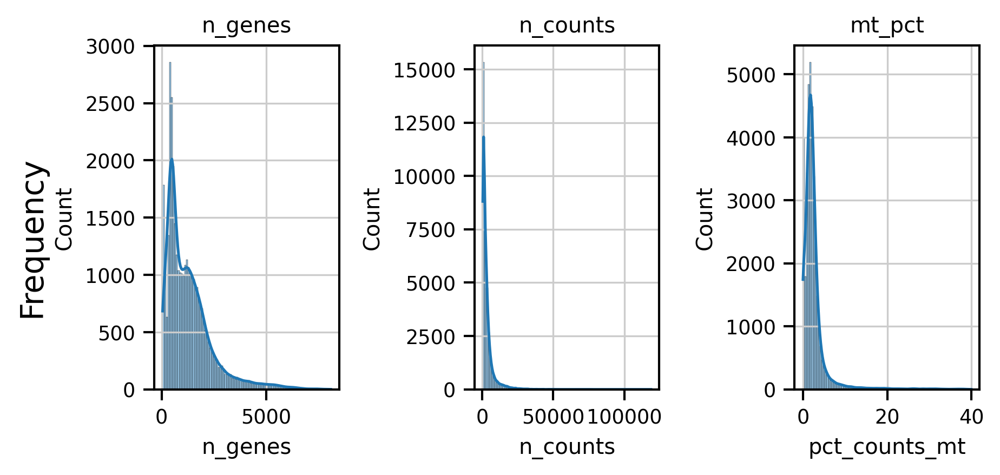

In [ ]:

sb.set_context('paper')


fig, (ax1, ax2, ax3) = pl.subplots(1, 3, figsize=(6, 3), dpi=150, sharey=False)
adata.obs['n_genes']

sb.histplot( adata.obs['n_genes'], ax=ax1, kde=True, bins=100)
sb.histplot( adata.obs['n_counts'], ax=ax2, kde=True, bins=100)
sb.histplot(adata.obs['pct_counts_mt'], ax=ax3, kde=True, bins=100)

ax1.title.set_text('n_genes')
ax2.title.set_text('n_counts')
ax3.title.set_text('mt_pct')

fig.text(0.00, 0.5, 'Frequency', ha='center', va='center', rotation='vertical', size='x-large')

fig.tight_layout()
savefig='figures/'+samplename + '_7_QC_filtering_postfilter.pdf'
fig.savefig(savefig, dpi=300, bbox_inches='tight')

#interactive filtering


In [ ]:
def h(counts=1000, genes=200,mito=20):
    conditions = [
        (adata.obs['n_counts'] < counts),#Low_nCounts
        (adata.obs['n_genes'] < genes),#Low_ngenes
        (adata.obs['pct_counts_mt'] >mito),#High_MT
        (adata.obs['pct_counts_mt'] <= mito) & (adata.obs['n_counts'] >= counts) & (adata.obs['n_genes'] >= genes)]#Passing
    values = ['Low_nCounts', 'Low_ngenes','High_MT', 'Passing']
    adata.obs['QC'] = np.select(conditions, values)
    adata.obs['QC'] = adata.obs['QC'].astype('category')

    new_df1=pd.DataFrame(adata.obs['QC'].value_counts()).reset_index()
    p=sb.barplot(x='index',y='QC',data=new_df1,color='sandybrown')
    show_values(p)


interactive_plot = interactive(h, counts=(0, 2000,20), genes=(0, 2000,20), mito=(0, 100, 1))
output = interactive_plot.children[-1]
output.layout.height = '350px'
interactive_plot

interactive(children=(IntSlider(value=1000, description='counts', max=2000, step=20), IntSlider(value=200, des…

In [ ]:
adata = adata[adata.obs['QC'] == 'Passing']
adata

View of AnnData object with n_obs × n_vars = 25925 × 21907
    obs: 'sample', 'condition', 'donor', 'date', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'batch', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC'
    var: 'feature_type', 'id', 'mito', 'n_cells', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'sample_colors', 'condition_colors', 'donor_colors'
    layers: 'cellbender', 'cellranger', 'counts'

In [ ]:
sc.pp.filter_cells(adata, max_counts = 100000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

Number of cells after max count filter: 25924


In [ ]:
adata.write(samplename+'_QCfiltered_20230228.h5ad')

In [ ]:
adata=sc.read(samplename+'_QCfiltered_20230228.h5ad')
adata



#Normalize QC Passing

### log1p proportional fitting


In [ ]:
adata.layers["counts"] = adata.layers["cellbender"]
adata.X= adata.layers["counts"]
adata.layers["log_norm"]=sc.pp.log1p(sc.pp.normalize_total(adata,inplace=False,target_sum=1e4)["X"])
# proportional fitting to mean of cell depth
proportional_fitting = sc.pp.normalize_total(adata, target_sum=None, inplace=False)
# log1p transform
adata.layers["log1pPF_normalization"] = sc.pp.log1p(proportional_fitting["X"])

In [ ]:
adata.layers["PFlog1pPF_normalization"] = sc.pp.normalize_total(adata, target_sum=None, layer="log1pPF_normalization", inplace=False)["X"]


In [ ]:
adata.write(samplename+'_QCfiltered_Normalized_20230228.h5ad')

In [ ]:
adata=sc.read(samplename+'_QCfiltered_Normalized_20230228.h5ad')

# cellcycle score

In [ ]:
adata.X=adata.layers['PFlog1pPF_normalization']

In [ ]:
s_genes = ['Mcm5','Pcna','Tyms','Fen1','Mcm7','Mcm4','Rrm1','Ung','Gins2','Mcm6','Cdca7','Dtl','Prim1',
           'Uhrf1','Cenpu','Hells','Rfc2','Polr1b','Nasp','Rad51ap1','Gmnn','Wdr76','Slbp','Ccne2','Ubr7',
           'Pold3','Msh2','Atad2','Rad51','Rrm2','Cdc45','Cdc6','Exo1','Tipin','Dscc1','Blm','Casp8ap2',
           'Usp1','Clspn','Pola1','Chaf1b','Mrpl36','E2f8']
g2m_genes = ['Hmgb2','Cdk1','Nusap1','Ube2c','Birc5','Tpx2','Top2a','Ndc80','Cks2','Nuf2','Cks1b',
             'Mki67','Tmpo','Cenpf','Tacc3','Pimreg','Smc4','Ccnb2','Ckap2l','Ckap2','Aurkb','Bub1',
             'Kif11','Anp32e','Tubb4b','Gtse1','Kif20b','Hjurp','Cdca3','Jpt1','Cdc20','Ttk','Cdc25c',
             'Kif2c','Rangap1','Ncapd2','Dlgap5','Cdca2','Cdca8','Ect2','Kif23','Hmmr','Aurka','Psrc1',
             'Anln','Lbr','Ckap5','Cenpe','Ctcf','Nek2','G2e3','Gas2l3','Cbx5','Cenpa']
cell_cycle_genes = s_genes + g2m_genes
display(len(s_genes))
display(len(g2m_genes))
display(len(cell_cycle_genes))

43

54

97

In [ ]:
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]
len(cell_cycle_genes)

97

In [ ]:
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

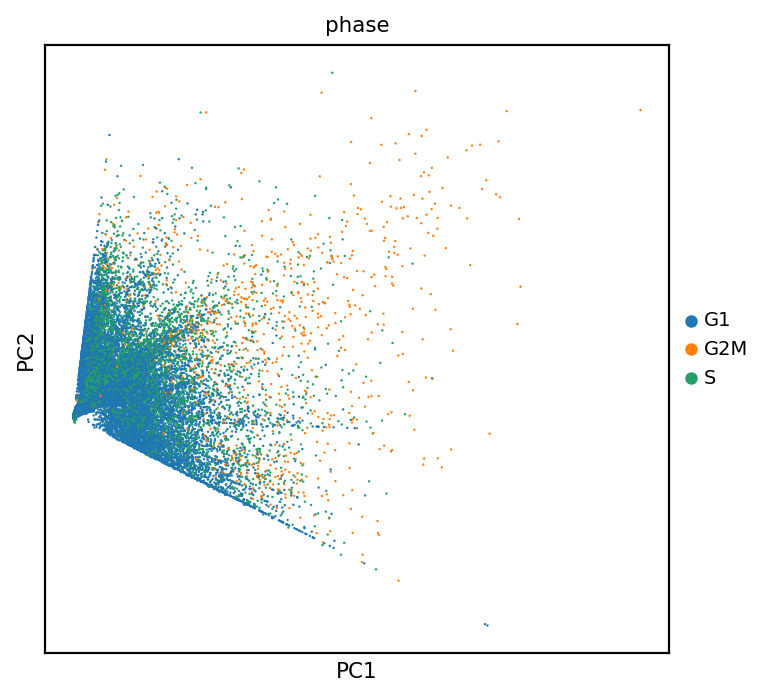

In [ ]:
savefig=samplename+"_8_QC_cellcycle.pdf"

adata_cc_genes = adata[:, cell_cycle_genes]
sc.tl.pca(adata_cc_genes)
sc.pl.pca_scatter(adata_cc_genes, color='phase',save=savefig)

#QC passing, Normalized: PFlog1pPF layer, Harmony --> Triku --> neighbors with triku


In [ ]:
adata.X=adata.layers['PFlog1pPF_normalization']
#PCA
sc.pp.pca(adata, n_comps=30,random_state=42,use_highly_variable=False, svd_solver="arpack")
#Harmony
sce.pp.harmony_integrate(adata, key='sample', epsilon_cluster = 1e-4, epsilon_harmony = 1e-5, max_iter_harmony=50)
#neighbors
sc.pp.neighbors(adata, use_rep='X_pca_harmony',  n_neighbors=int(0.5*len(adata) ** 0.5 // 2), metric='cosine')

2023-03-07 20:04:28,590 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2023-03-07 20:04:38,951 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2023-03-07 20:04:39,161 - harmonypy - INFO - Iteration 1 of 50
INFO:harmonypy:Iteration 1 of 50
2023-03-07 20:04:51,604 - harmonypy - INFO - Iteration 2 of 50
INFO:harmonypy:Iteration 2 of 50
2023-03-07 20:05:05,089 - harmonypy - INFO - Iteration 3 of 50
INFO:harmonypy:Iteration 3 of 50
2023-03-07 20:05:08,489 - harmonypy - INFO - Iteration 4 of 50
INFO:harmonypy:Iteration 4 of 50
2023-03-07 20:05:12,640 - harmonypy - INFO - Iteration 5 of 50
INFO:harmonypy:Iteration 5 of 50
2023-03-07 20:05:17,261 - harmonypy - INFO - Iteration 6 of 50
INFO:harmonypy:Iteration 6 of 50
2023-03-07 20:05:26,049 - harmonypy - INFO - Iteration 7 of 50
INFO:harmonypy:Iteration 7 of 50
2023-03-07 20:05:29,933 - 

In [ ]:
adata.write(samplename+'_QCfilteredNormalized_Harmony_20230229.h5ad')

In [ ]:
adata=sc.read(samplename+'_QCfilteredNormalized_Harmony_20230229.h5ad')

###run Triku
https://triku.readthedocs.io/en/latest/


In [ ]:
sc.pp.filter_genes(adata, min_cells=20)

In [ ]:
tk.tl.triku(adata, n_windows=100,)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata.var['highly_variable'])))


 Number of highly variable genes: 1501


In [ ]:
adata

AnnData object with n_obs × n_vars = 25924 × 18500
    obs: 'sample', 'condition', 'donor', 'date', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'batch', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC', 'S_score', 'G2M_score', 'phase'
    var: 'feature_type', 'id', 'mito', 'n_cells', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'triku_distance', 'triku_distance_uncorrected', 'triku_highly_variable'
    uns: 'sample_colors', 'condition_colors', 'donor_colors', 'pca', 'neighbors', 'triku_params'
    obsm: 'X_pca', 'X_pca_harmony', 'X_triku'
    varm: 'PCs'
    layer

In [ ]:
adata.X=adata.layers['counts']

In [ ]:
adata.X=adata.layers['PFlog1pPF_normalization']
#neighbors
sc.pp.neighbors(adata, n_neighbors=int(0.5*len(adata) ** 0.5 // 2), metric='cosine', use_rep="X_triku")

In [ ]:
adata

AnnData object with n_obs × n_vars = 25924 × 18500
    obs: 'sample', 'condition', 'donor', 'date', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'batch', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC', 'S_score', 'G2M_score', 'phase'
    var: 'feature_type', 'id', 'mito', 'n_cells', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'triku_distance', 'triku_distance_uncorrected', 'triku_highly_variable'
    uns: 'sample_colors', 'condition_colors', 'donor_colors', 'pca', 'neighbors', 'triku_params'
    obsm: 'X_pca', 'X_pca_harmony', 'X_triku'
    varm: 'PCs'
    layer

In [ ]:
deletevar =['triku_params']

for x in deletevar:
  del adata.uns[x]

adata

AnnData object with n_obs × n_vars = 25924 × 18500
    obs: 'sample', 'condition', 'donor', 'date', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'batch', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC', 'S_score', 'G2M_score', 'phase'
    var: 'feature_type', 'id', 'mito', 'n_cells', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'triku_distance', 'triku_distance_uncorrected', 'triku_highly_variable'
    uns: 'sample_colors', 'condition_colors', 'donor_colors', 'pca', 'neighbors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_triku'
    varm: 'PCs'
    layers: 'cellbender',

In [ ]:
adata.write(samplename+'_QCfilteredNormalized_Harmony_Triku_20230229.h5ad')

In [ ]:
adata=sc.read(samplename+'_QCfilteredNormalized_Harmony_Triku_20230229.h5ad')

### Plotting

In [ ]:
sc.tl.umap(adata,random_state=42)

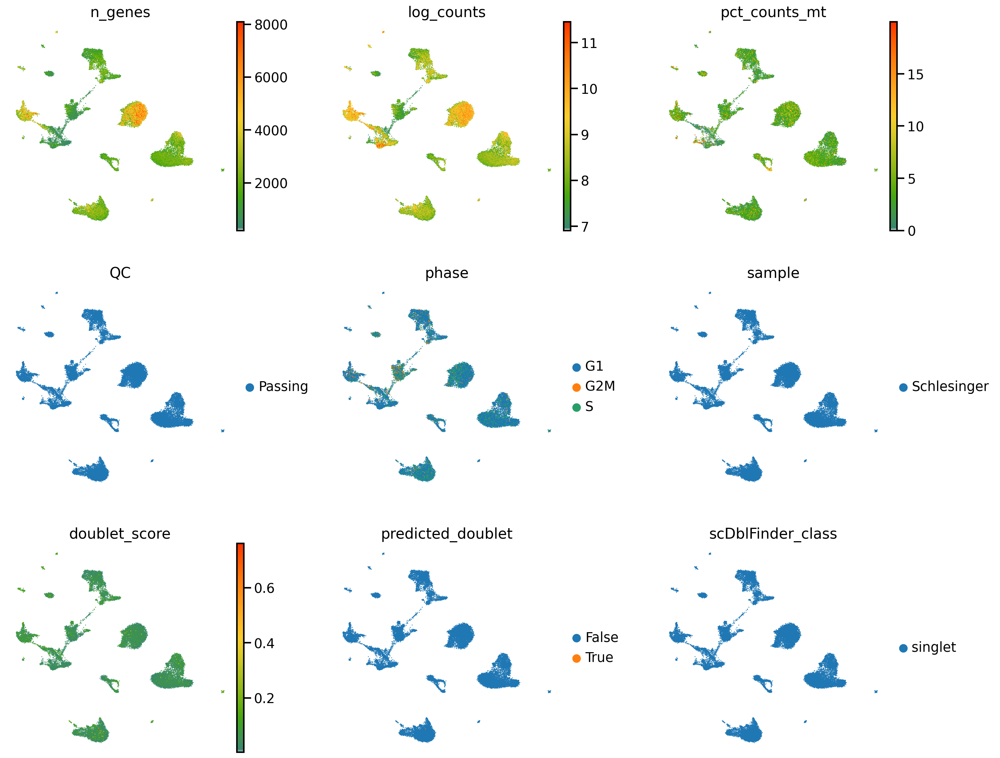

In [ ]:
adata.obs['predicted_doublet'] = adata.obs['predicted_doublet'].astype(str).astype('category')


sb.set_context('talk')
pl.rcParams['figure.figsize']=(5,5)
genes_to_plot = ['n_genes','log_counts','pct_counts_mt','QC','phase','sample','doublet_score','predicted_doublet','scDblFinder_class']
sc.pl.umap(adata, wspace=0.3,color = genes_to_plot,ncols=3,cmap=mymap,legend_fontoutline=3, legend_fontweight='normal',frameon=False)

In [ ]:
marker_genes=['Clps',	'Spp1',	'Dcn',	'C1qa',	'Cpa1','Cd74',	'Fabp4',	'Cd52'	,'Cd79a',	'Upk3b',	'Mmrn1',	'Prnp'	,'Nupr1',]

In [ ]:
print(len(marker_genes))
filter=np.in1d(marker_genes, adata.var_names)
marker_genes = list(np.array(marker_genes)[filter])
print(len(marker_genes))

13
13


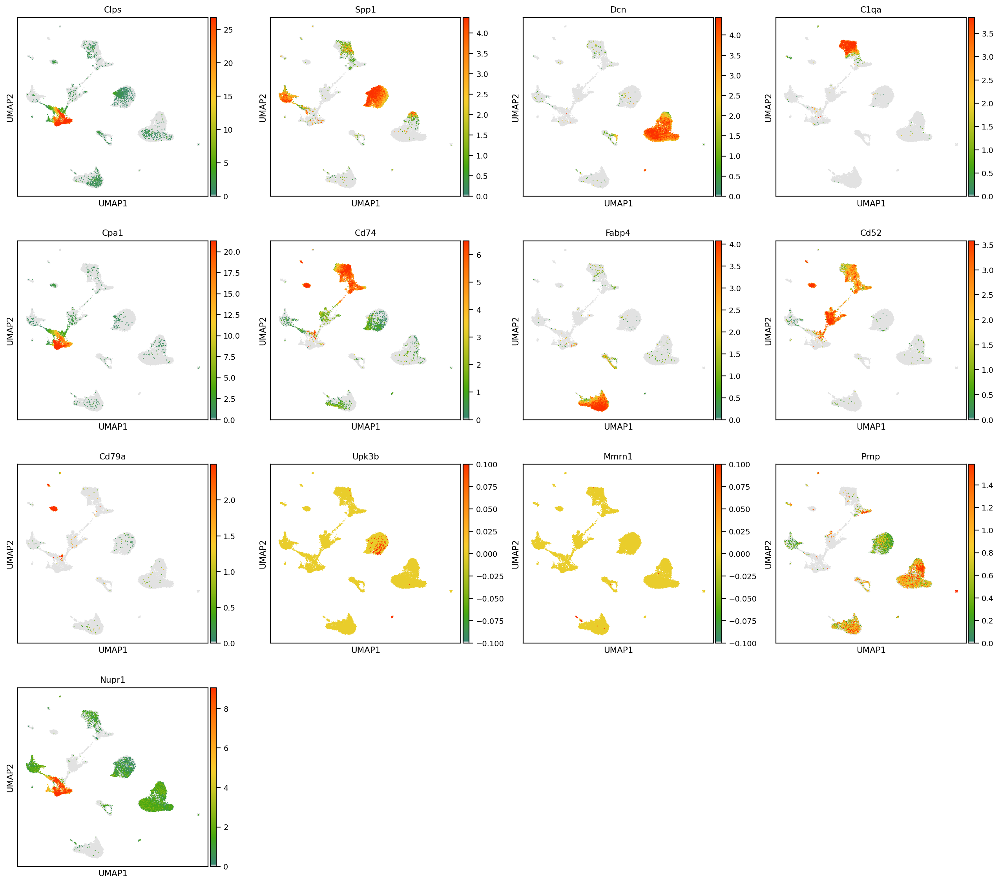

In [ ]:
sb.set_context('paper')
pl.rcParams['figure.figsize']=(4,4) #rescale figures
sc.pl.umap(adata=adata, color=marker_genes,color_map=mymap,vmin='p20', vmax='p99',ncols=4,
           legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',use_raw=False,layer="PFlog1pPF_normalization")

##Leiden - keep doublets -> QC Passing, normalized, Harmony, Triku, Neighbors with Triku

In [ ]:
%%capture

sc.tl.leiden(adata,random_state=random_state, resolution=0.8, key_added='leiden_r0.8')
sc.tl.leiden(adata,random_state=random_state, resolution=0.5, key_added='leiden_r0.5')
sc.tl.leiden(adata,random_state=random_state, resolution=0.4, key_added='leiden_r0.4')
sc.tl.leiden(adata,random_state=random_state, resolution=0.3, key_added='leiden_r0.3')
sc.tl.leiden(adata,random_state=random_state, resolution=0.2, key_added='leiden_r0.2')

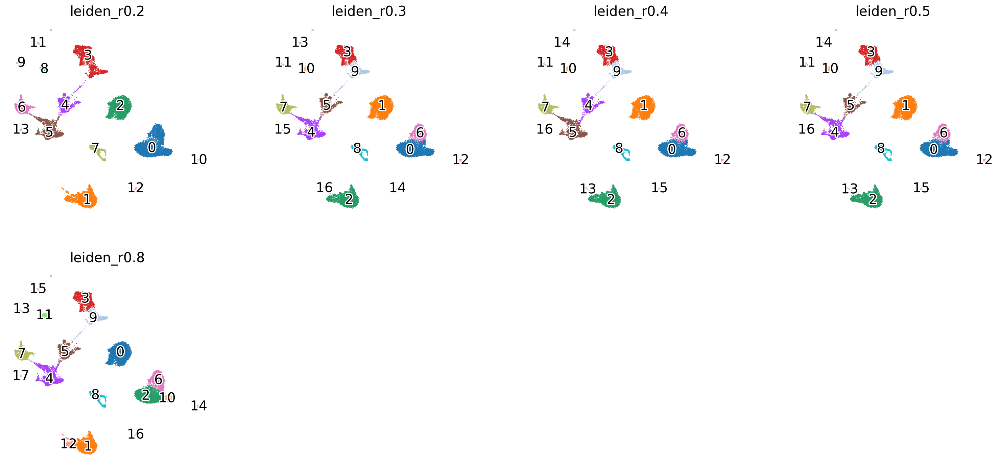

In [ ]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(5,5)
sc.pl.umap(adata, color=['leiden_r0.2','leiden_r0.3','leiden_r0.4','leiden_r0.5','leiden_r0.8'], legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',frameon=False)

###Chose Leiden

In [ ]:
leiden='leiden_r0.4'

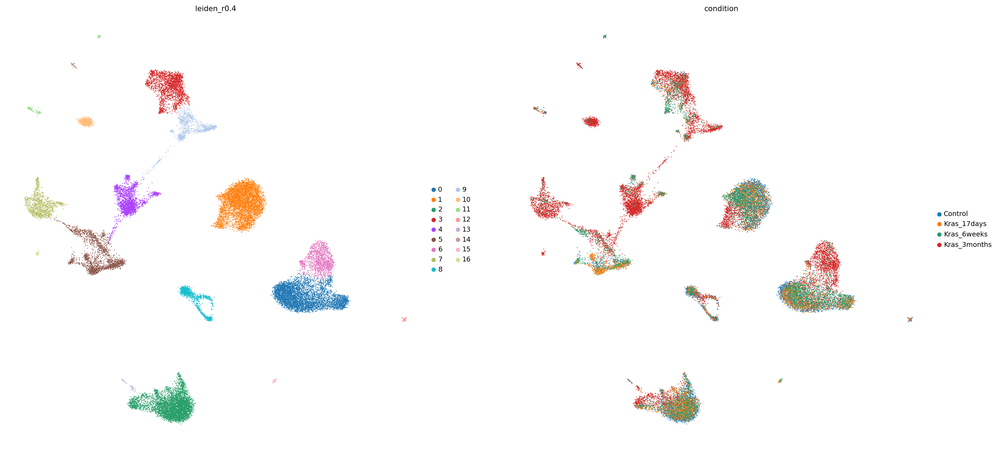

In [ ]:
sb.set_context('paper')
pl.rcParams['figure.figsize']=(10,10)
sc.pl.umap(adata, color=[leiden,'condition'],legend_fontoutline=3, legend_fontweight='normal',frameon=False)

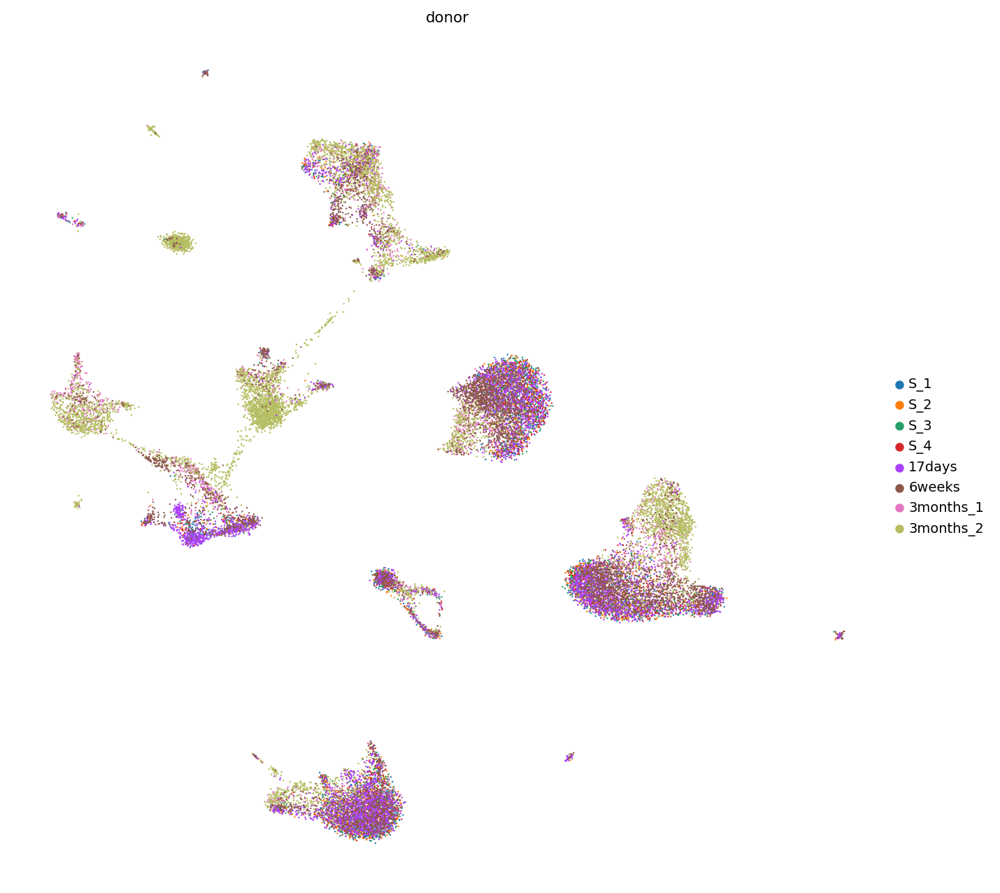

In [ ]:
sb.set_context('paper')
pl.rcParams['figure.figsize']=(10,10)
sc.pl.umap(adata, color=['donor'],legend_fontoutline=3, legend_fontweight='normal',frameon=False)

## plot Markergenes

In [ ]:
markers={'Ductal': ['Clu','Krt19','Sox9','Krt8','Krt18','Spp1','Pkhd1'],
         'Acinar':['Cpa1','Cela1','Cela3b','Zg16','Clps'],
         'ADM':['Cpa1','Clu','Krt19','Sox9','Krt8','Krt18','Spp1','Pkhd1','Cela1','Cela3b','Zg16','Clps']}

In [ ]:
marker_labels = list(set(markers))

In [ ]:
for ix, clust in enumerate(marker_labels):
  geneset=markers[clust]
  sc.tl.score_genes(adata, geneset, ctrl_size=500, use_raw=False,score_name=clust)

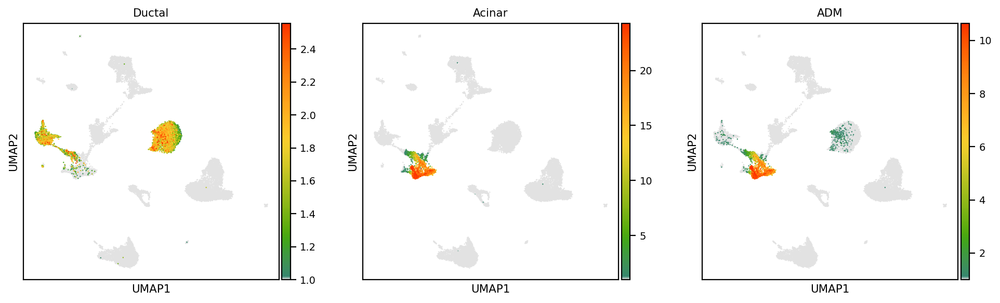

In [ ]:
pl.rcParams['figure.figsize']=(4,4)
sc.pl.umap(adata, color=marker_labels,sort_order=True,vmin=1, vmax='p99.9',color_map=mymap)

### Rank Marker genes

In [ ]:
#method : {‘logreg’, ‘t-test’, ‘wilcoxon’, ‘t-test_overestim_var’} | None (default: None)
sc.tl.rank_genes_groups(adata, leiden, method='wilcoxon',n_genes=adata.shape[1],layer='PFlog1pPF_normalization', rankby_abs=False,corr_method='bonferroni',key_added='wilcoxon_rank_genes_groups' )
wilcoxon=pd.DataFrame(adata.uns['wilcoxon_rank_genes_groups']['names']).head(100)
wilcoxon

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,Gsn,Spp1,Flt1,Lyz2,Rps15a,Try5,Bgn,Clu,Ndufa4l2,Cd74,Igkc,Pcsk2,Gfra3,Cldn5,Jchain,Igfbp5,Krt18
1,Dcn,Tm4sf4,Plvap,Tyrobp,Tmsb10,Ctrb1,Col1a1,Onecut2,Myl9,H2-Aa,Cd74,Ptprn2,Cryab,Lyve1,Igkc,Igfbp6,H2afj
2,Clec3b,Cldn3,Fabp4,Fcer1g,Rps3,Prss2,Col1a2,Tspan8,Cald1,H2-Eb1,H2-Aa,Chga,Prnp,Galnt18,Malat1,Upk3b,Ltc4s
3,Col3a1,Pkhd1,Egfl7,C1qb,Rpl19,Reg1,Olfml3,Cystm1,Rgs5,Tmsb4x,Fau,Cpe,Csmd1,Timp3,Mzb1,Rarres2,Cystm1
4,Gpx3,Dbi,Ly6c1,Ftl1,Rps7,Pnliprp1,Col3a1,Fxyd3,Prkg1,H2-Ab1,H2-Ab1,Pcsk1n,Fxyd1,Dock9,B2m,Aebp1,Krt8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,Fth1,Kansl1l,Mef2c,Gmfg,mt-Co3,Rpl3,Lama2,Plaur,Tshz2,Mrtfa,Satb1,Tox,Gatm,Tanc2,Sub1,Ildr2,Bpgm
96,Gstm1,Rab25,Tspan9,Mafb,Shisa5,Uqcrq,Tmsb10,Pigr,Itgb1,Rps23,Rac2,Gnas,Lpar1,Igfbp5,Cytip,Ahnak2,Chchd2
97,Col5a3,Csrp1,Slfn5,Rel,Mir142hg,Rps18,Copz2,Galnt3,Morrbid,H2-DMb2,Gm26740,Pyy,Ifi27,Lcn2,Rps9,Wls,Fau
98,Hspg2,Lsr,Elk3,Fxyd5,Vps37b,Rps29,Prnp,Tes,Tsc22d1,Jak2,Bach2,Syt7,Arpc1b,Pdpn,Rps7,Gjb5,Ndufb9


In [ ]:
savetable=samplename +leiden+"_wilcoxon_marker_genes_triku.csv"
wilcoxon.to_csv(savetable)

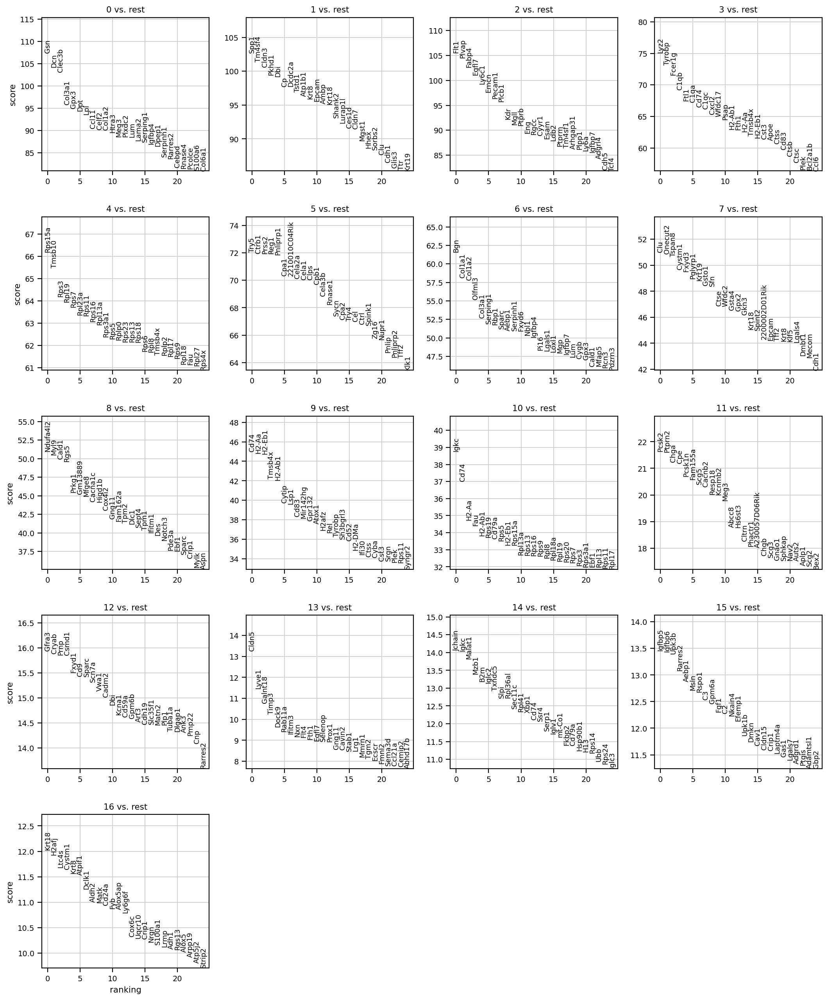

In [ ]:
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key="wilcoxon_rank_genes_groups")

###Markers

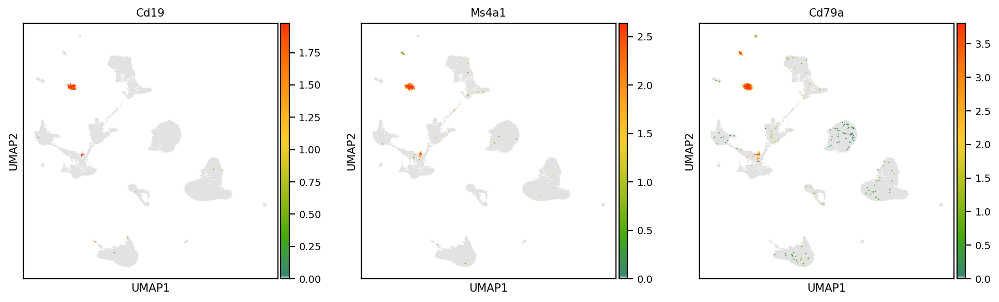

In [ ]:
#B cells
#Markers from https://www.cellsignal.com/pathways/immune-cell-markers-mouse and https://www.nature.com/articles/s41591-021-01329-2/figures/1

#B = Cd19+, Cd20+(Ms4a1) Iga(Cd79a)+, IgA(Igha)
#Follicular b: Ighm/CD40(low), CD45R/Ptprc(high), CD23/Cr2, Cd38, CD23/Fcer1g

#Naive: Ighd+, Cd27-
#Switched memory: Ighd-, Cd27+
#Unswitched: Ighd+, Cd27+

#plasma = Bcma/Tnfrsf17+ or Cd138/Sdc1+

#markers of interest = Ccl11 (eotaxin, chemokine that attracts eosinophils)
marker_genes =['Cd19','Ms4a1','Cd79a']
sb.set_context('paper')
pl.rcParams['figure.figsize']=(4,4) #rescale figures
sc.pl.umap(adata, color=marker_genes,color_map=mymap,vmin=0, vmax='p99.9',ncols=4,
           legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',use_raw=False,layer="PFlog1pPF_normalization")


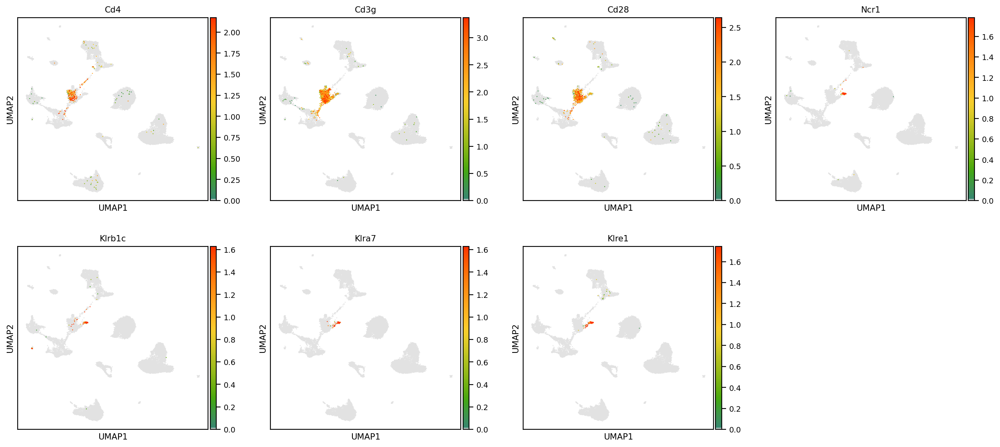

In [ ]:
#T, NKT, NK cells
#Markers from https://www.cellsignal.com/pathways/immune-cell-markers-mouse and https://www.nature.com/articles/s41591-021-01329-2/figures/1

#Treg = Cd4, Cd3g, Cd28, (From Ishizuka et al, 2018, Nature)


#NK cells = Ncr1+,Klrb1c+, Klra7, Klre1, Cd3- (From Ishizuka et al, 2018, Nature)

#markers of interest - eotaxin= Ccl11

marker_genes =['Cd4','Cd3g', 'Cd28','Ncr1','Klrb1c', 'Klra7', 'Klre1']
sb.set_context('paper')
pl.rcParams['figure.figsize']=(4,4) #rescale figures
sc.pl.umap(adata, color=marker_genes,color_map=mymap,vmin=0, vmax='p99.9',ncols=4,
           legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',use_raw=False,layer="PFlog1pPF_normalization")

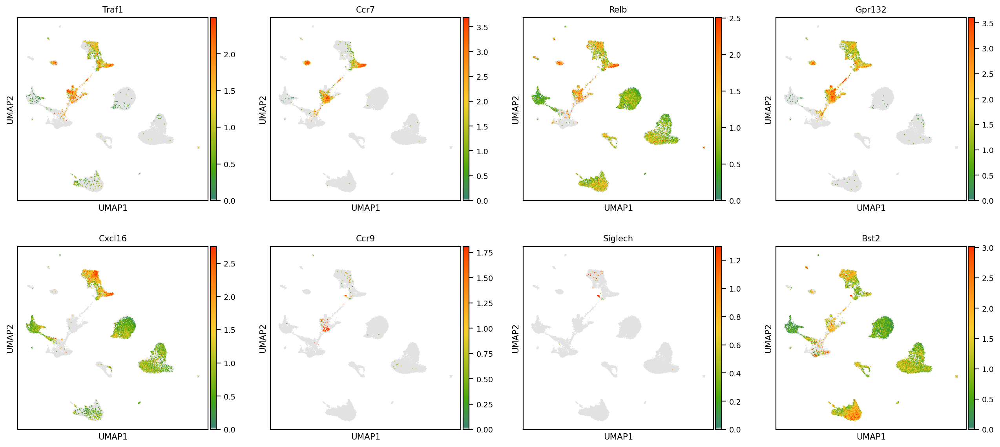

In [ ]:
##KA
#'Migratory cDC': ['Traf1', 'Ccr7', 'Relb', 'Gpr132', 'Cxcl16'],
#plasmacytoid DC = Ccr9, Siglech, Bst2 (From Ishizuka et al, 2018, Nature)


marker_genes =['Traf1', 'Ccr7', 'Relb', 'Gpr132', 'Cxcl16', 'Ccr9','Siglech','Bst2']
sb.set_context('paper')
pl.rcParams['figure.figsize']=(4,4) #rescale figures
sc.pl.umap(adata, color=marker_genes,color_map=mymap,vmin=0, vmax='p99.9',ncols=4,
           legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',use_raw=False,layer="PFlog1pPF_normalization")

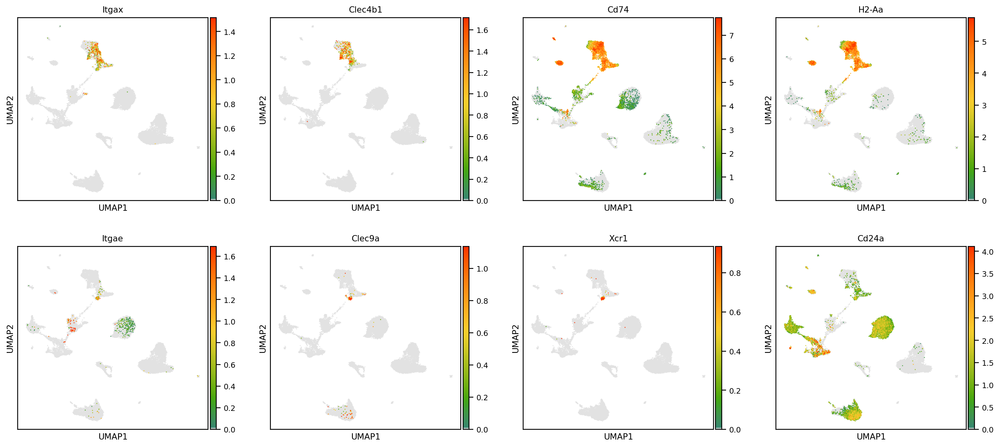

In [ ]:
#KA DC updated
#'cDC2': ['Itgax','Clec4b1','Cd74', 'H2-Aa'], #'H2-Ab1', 'H2-Eb1'
#'cDC1': ['Itgae',  'Clec9a', 'Xcr1', 'Cd24a'], #'Flt3', 'Cst3',
marker_genes =['Itgax','Clec4b1','Cd74', 'H2-Aa','Itgae',  'Clec9a', 'Xcr1', 'Cd24a']
sb.set_context('paper')
pl.rcParams['figure.figsize']=(4,4) #rescale figures
sc.pl.umap(adata, color=marker_genes,color_map=mymap,vmin=0, vmax='p99.9',ncols=4,
           legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',use_raw=False,layer="PFlog1pPF_normalization")

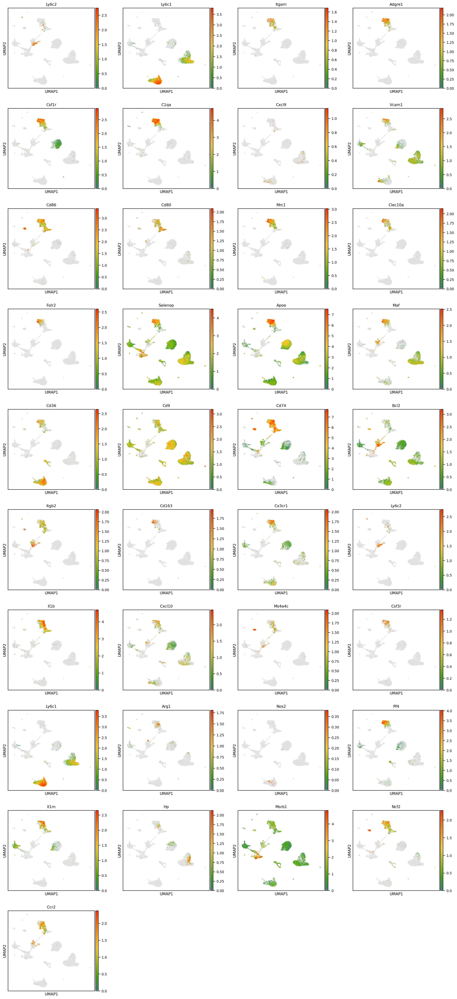

In [ ]:
#Immune markers from https://www.cellsignal.com/pathways/immune-cell-markers-mouse

#All macrohphages = Itgam, Adgre1 (From Ishizuka et al, 2018, Nature)
  # Csf1r from CellSignal
#M1 = C1qa, Cxcl9, Vcam1 (From Ishizuka et al, 2018, Nature)
  # Cd86, Cd80 from CellSignal
#M2 = Mrc1, Clec10a, Folr2, Sepp1/Selenop, Apoe, Maf (From Ishizuka et al, 2018, Nature)
  #Cd9, Cd74, Bcl2, Arg1, Cd36. https://www.frontiersin.org/articles/10.3389/fimmu.2019.01084/full
  #Cd163 from CellSignal
#M0 macrophage =Cx3cr1 (Cell singal)

#Monocyte =  Itgam, Ly6c2, Il1b, Cxcl10, Ms4a4c, (From Ishizuka et al, 2018, Nature)
  #note Cd14+, Adgre1- from CellSignal
#MDSC = Itgam, Arg1, Nos2, Pf4, Il1rn (From Ishizuka et al, 2018, Nature)
  #"subpopulations have been shown to exist: PMN-MDSC (CD11b+Ly6G+Ly6Clo) and M-MDSC (CD11b+Ly6G−Ly6Chi)" https://www.nature.com/articles/ncomms12150#Tab3


#neutrophil = itgam, ly6c2, Hp, Msrb1, Ncf2

#PMN=Ly6g, Adgre1+,
#Ccr2= monocyte, DCs, Macrophages
#Csf3r+ = monocytes, macrophages, PMN


marker_genes =['Ly6c2','Ly6c1','Itgam', 'Adgre1','Csf1r','C1qa', 'Cxcl9', 'Vcam1','Cd86','Cd80','Mrc1', 'Clec10a', 'Folr2', 'Selenop', 'Apoe', 'Maf','Cd36','Cd9', 'Cd74', 'Bcl2','Itgb2','Cd163','Cx3cr1','Ly6c2','Il1b', 'Cxcl10', 'Ms4a4c','Csf3r','Ly6c1','Arg1', 'Nos2', 'Pf4', 'Il1rn','Hp', 'Msrb1', 'Ncf2', 'Ccr2']
sb.set_context('paper')
pl.rcParams['figure.figsize']=(4,4) #rescale figures
sc.pl.umap(adata, color=marker_genes,color_map=mymap,vmin=0, vmax='p99.9',ncols=4,
           legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',use_raw=False,layer="PFlog1pPF_normalization")

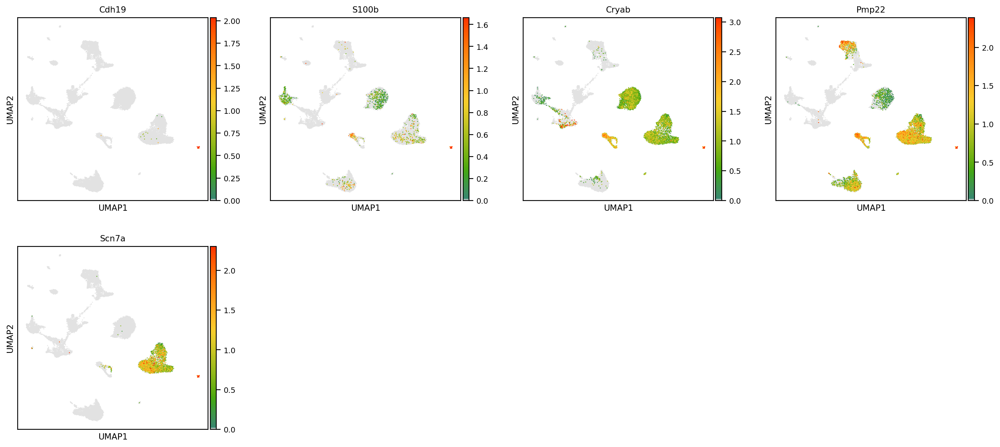

In [ ]:
#'TostiSchwann':['Cdh19','S100b','Cryab','Pmp22','Scn7a'],
marker_genes = ['Cdh19','S100b','Cryab','Pmp22','Scn7a']
sb.set_context('paper')
pl.rcParams['figure.figsize']=(4,4) #rescale figures
sc.pl.umap(adata, color=marker_genes,color_map=mymap,vmin=0, vmax='p99.9',ncols=4,
           legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',use_raw=False,layer="PFlog1pPF_normalization")

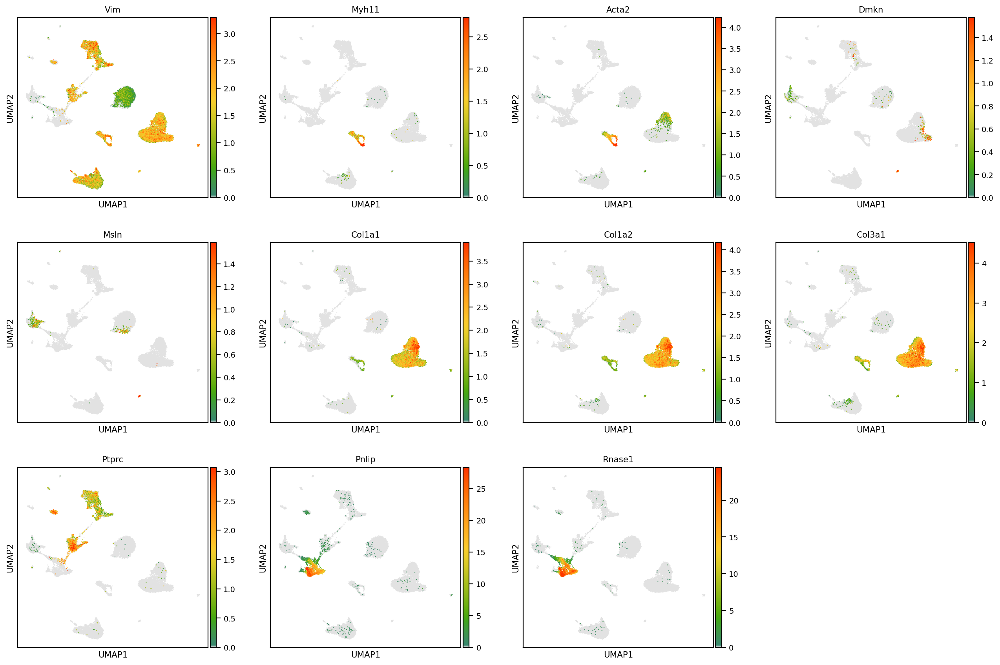

In [ ]:

marker_genes = ['Vim','Myh11','Acta2','Dmkn','Msln','Col1a1','Col1a2','Col3a1','Ptprc','Pnlip','Rnase1']
sb.set_context('paper')
pl.rcParams['figure.figsize']=(4,4) #rescale figures
sc.pl.umap(adata, color=marker_genes,color_map=mymap,vmin=0, vmax='p99.9',ncols=4,
           legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',use_raw=False,layer="PFlog1pPF_normalization")

## Annotation

In [ ]:
#Cells annotated 01/09/23
adata.obs['annotated'] = adata.obs['leiden_r0.4'].cat.add_categories(['Acinar','Macrophage / DC','Mesothelial','Ductal2','DCs','ADM?','Bcell','Acinar?','Ductal','NaiveB','T / NK','NK(T?)','ADM','RBC2','Monocyte?','Macrophage','B','Plasmacytoid_DCs','Monocyte/PMN?','Immune','Endothelial','Endothelial2','Endocrine','Endocrine2','Endocrine3','Plasma_cells','Fibroblast','Fibroblast2','Fibroblast3','Macrophage1','Macrophage2','NK','NKT','Immune?','Immune1','Immune2','Immune3','Immune4','Immune5','Pericyte','Acinar2?','_1?_', '_2?_','_3?_','MitoHigh','RBC','Junk?'])

adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['5'])] = 'Acinar'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['1'])] = 'Ductal'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['7'])] = 'ADM'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['2','13'])] = 'Endothelial'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['0','6','15'])] = 'Fibroblast'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], [''])] = 'Mesothelial'

adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['3','9'])] = 'Macrophage / DC'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['10'])] = 'B'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['4',''])] = 'T / NK'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], [''])] = 'RBC'


adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['11'])] = 'Endocrine'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['8'])] = 'Pericyte'


adata.obs['annotated'] = adata.obs['annotated'].cat.remove_unused_categories()

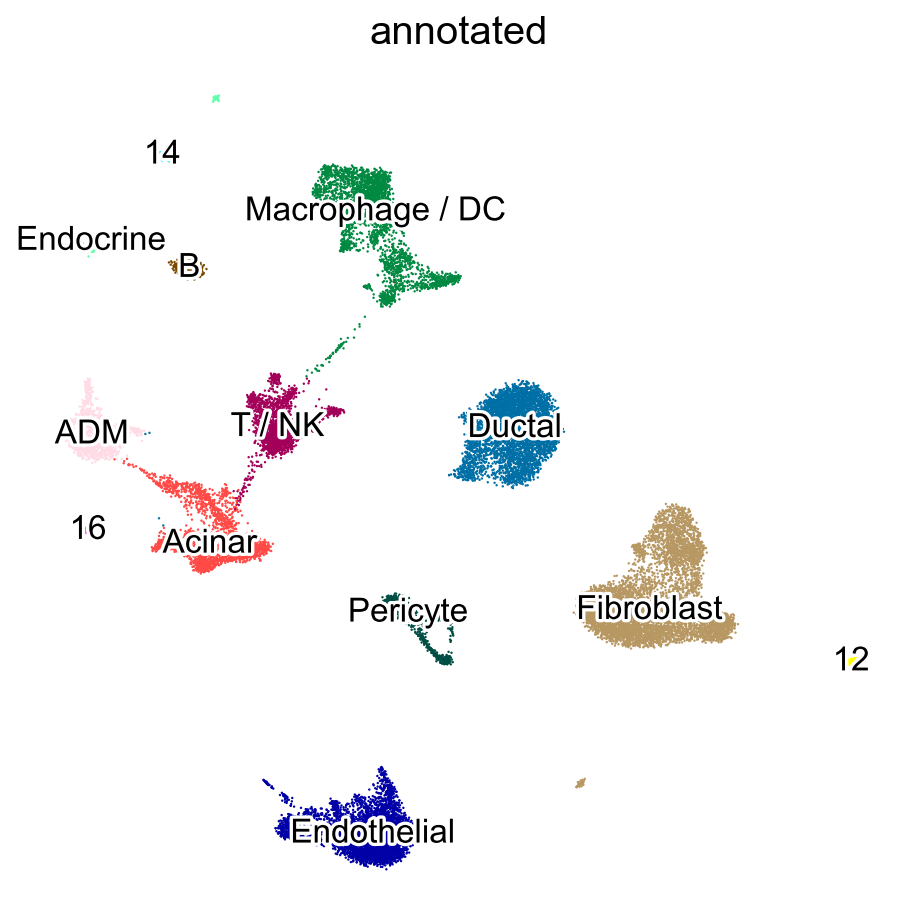

In [ ]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(7,7)
sc.pl.umap(adata, color=['annotated'], legend_loc='on data',cmap=mymap,legend_fontoutline=3,vmax='p99.9',legend_fontsize='small', legend_fontweight='normal',frameon=False)

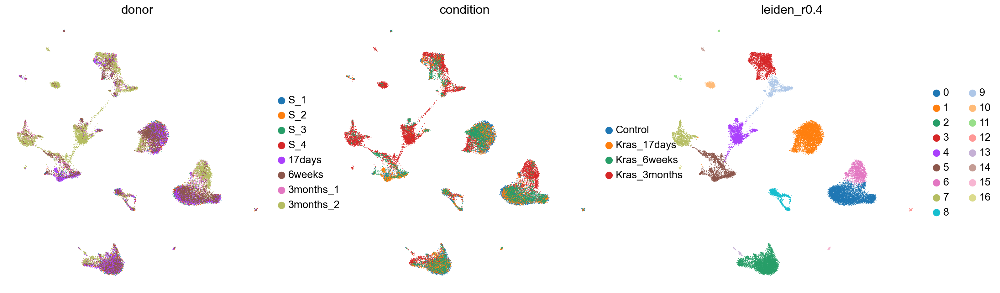

In [ ]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(7,7)
leiden='leiden_r0.4'
sc.pl.umap(adata, color=['donor','condition',leiden], legend_loc='right margin',cmap=mymap,legend_fontoutline=3,vmax='p99.9',legend_fontsize='small', legend_fontweight='normal',frameon=False)

#Save annotated object

In [ ]:
adata

AnnData object with n_obs × n_vars = 25924 × 18500
    obs: 'sample', 'condition', 'donor', 'date', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'batch', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC', 'S_score', 'G2M_score', 'phase', 'leiden_r0.8', 'leiden_r0.5', 'leiden_r0.4', 'leiden_r0.3', 'leiden_r0.2', 'Ductal', 'Acinar', 'ADM', 'annotated'
    var: 'feature_type', 'id', 'mito', 'n_cells', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'triku_distance', 'triku_distance_uncorrected', 'triku_highly_variable'
    uns: 'QC_colors', 'annotated_colors', 'condition_

In [ ]:
adata.write(samplename+'_QCfilteredNormalized_Harmony_Triku_Neighbors_annotated_20230406.h5ad')

#ADMi scoring

In [ ]:
#Run if need to load in adata
#adata=sc.read(samplename+'_QCfilteredNormalized_Harmony_Triku_Neighbors_annotated_20230406.h5ad')

In [ ]:
fm.rcParams['font.family']=['Arial']
sb.set_context('talk')

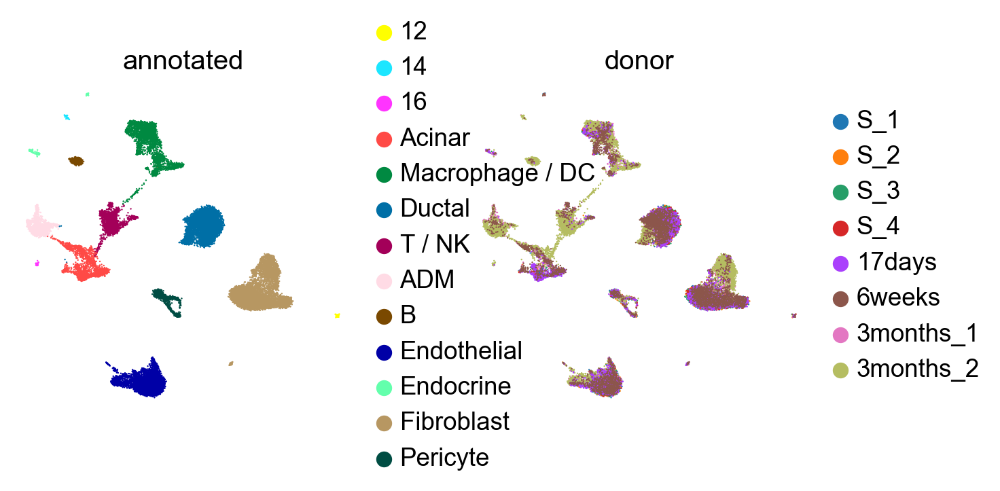

In [ ]:
sc.pl.umap(
    adata,
    color=["annotated",'donor'],
       vmin='p20',vmax='p99',
    frameon=False,
    ncols=2,
)

In [ ]:
ADMi={
    'Prss3','Gm2663', '1810009J06Rik', 'Gm5771', 'Prss1','Gm4744','Gm10334',
    'Reg2', 'Reg3b', 'Reg3g','Reg3a',
    'Krt18','Krt8', 'Krt19', 'Clu',
    'Tspan1','Cldn4'
}

In [ ]:
adata.X=adata.layers['PFlog1pPF_normalization']
sc.tl.score_genes(adata, ADMi, ctrl_size=500, use_raw=False,score_name="ADM_score")

###plotting

In [ ]:
plt.rcParams['figure.dpi']=200

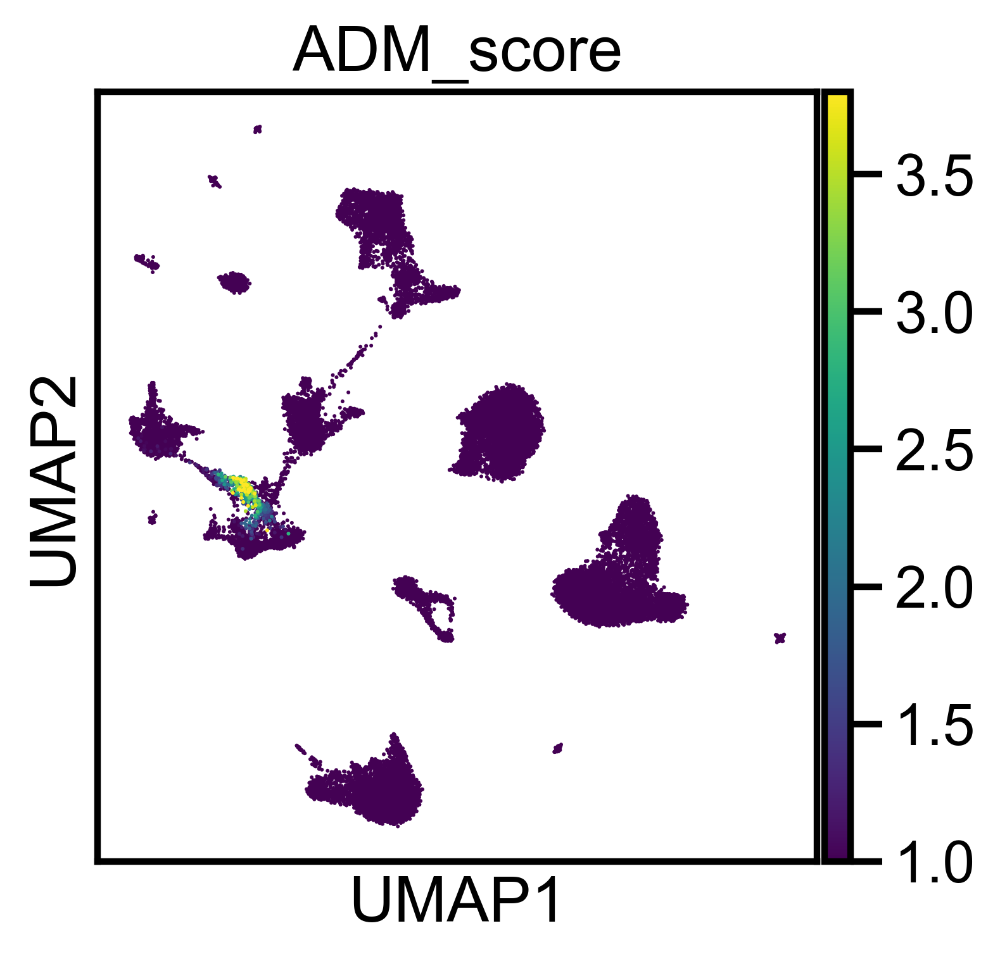

In [ ]:
plt.rcParams['figure.figsize']=(4,4)
sc.pl.umap(adata, color="ADM_score",sort_order=True,vmin=1, vmax='p99.9')

[Text(0, 0, '12'), Text(1, 0, '14'), Text(2, 0, '16'), Text(3, 0, 'Acinar'), Text(4, 0, 'Macrophage / DC'), Text(5, 0, 'Ductal'), Text(6, 0, 'T / NK'), Text(7, 0, 'ADM'), Text(8, 0, 'B'), Text(9, 0, 'Endothelial'), Text(10, 0, 'Endocrine'), Text(11, 0, 'Fibroblast'), Text(12, 0, 'Pericyte')]

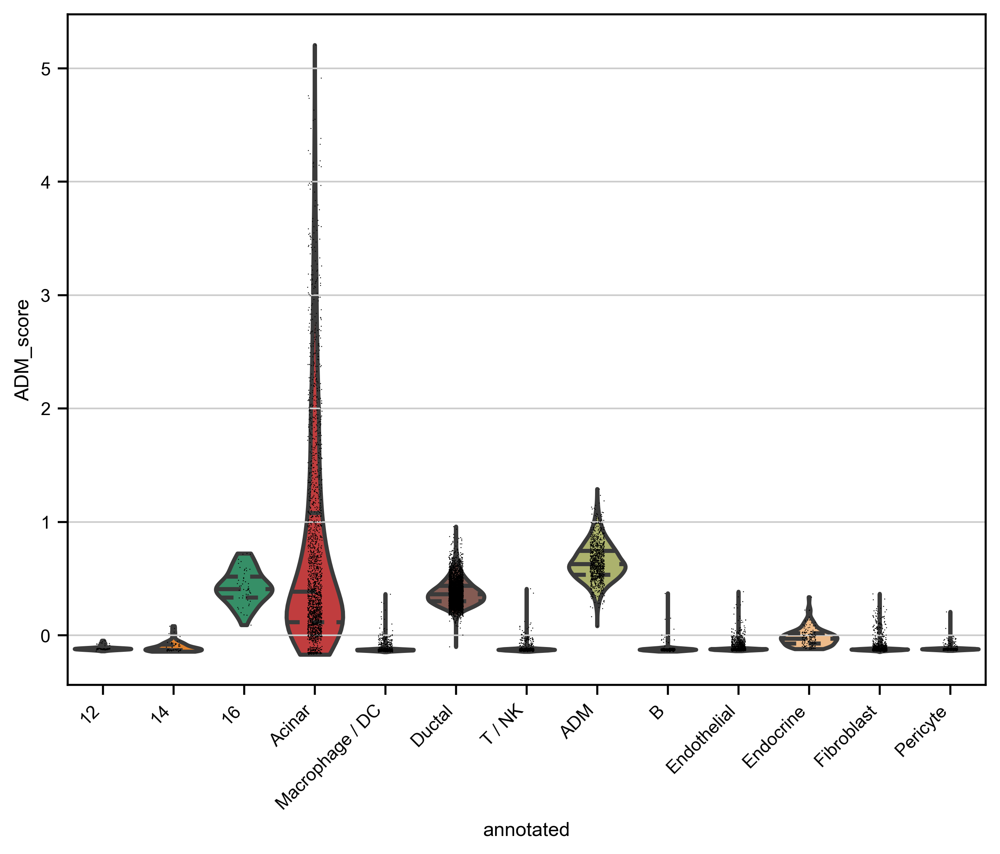

In [ ]:
sb.set_context('paper')
plt.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1) = plt.subplots(1, 1, figsize=(8,6), gridspec_kw={'wspace':0.2})

ax1_dict = sc.pl.violin(adata, "ADM_score", groupby='annotated', jitter=0.1, linewidth=2, alpha=0.25, inner="quartile",size=0.5, cut=0, ax=ax1, show=False)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right')

###Acinar

In [ ]:
acinar = adata[adata.obs['annotated'].isin(['Acinar'])]

In [ ]:
# define a dictionary to map old names to new names
mapping = {'Kras_17days': '17day', 'Kras_6weeks': '6week','Kras_3months': '3month'}

# use the replace method to rename categories
acinar.obs['condition'] = acinar.obs['condition'].replace(mapping)


In [ ]:
acinar.obs['condition'] = pd.Categorical(acinar.obs['condition'], categories=['Control', '17day', '6week', '3month'], ordered=True)

In [ ]:
acinar

AnnData object with n_obs × n_vars = 1983 × 18500
    obs: 'sample', 'condition', 'donor', 'date', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'batch', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC', 'S_score', 'G2M_score', 'phase', 'leiden_r0.8', 'leiden_r0.5', 'leiden_r0.4', 'leiden_r0.3', 'leiden_r0.2', 'Ductal', 'Acinar', 'ADM', 'annotated', 'ADM_score'
    var: 'feature_type', 'id', 'mito', 'n_cells', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'triku_distance', 'triku_distance_uncorrected', 'triku_highly_variable'
    uns: 'QC_colors', 'annotated_colors',

[Text(0, 0, 'Schlesinger')]

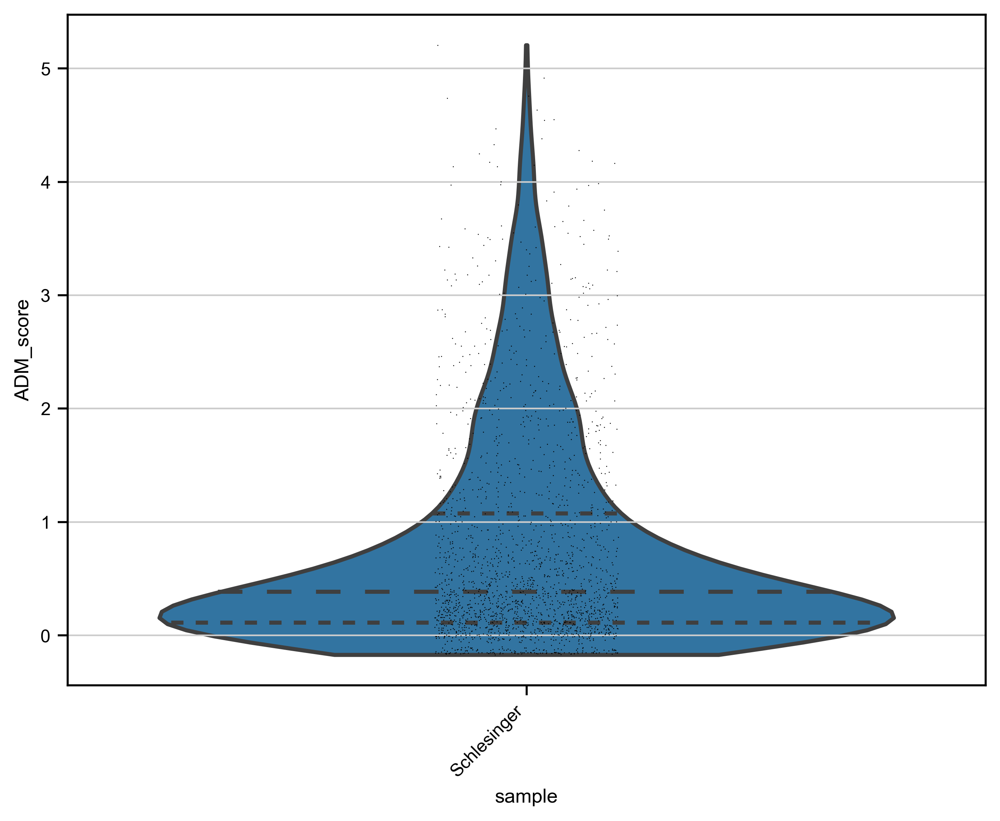

In [ ]:
sb.set_context('paper')
plt.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1) = plt.subplots(1, 1, figsize=(8,6), gridspec_kw={'wspace':0.2})

ax1_dict = sc.pl.violin(acinar, "ADM_score", groupby='sample', jitter=0.1, linewidth=2, alpha=0.25, inner="quartile",size=0.5, cut=0, ax=ax1, show=False)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right')

[Text(0, 0, 'S_1'), Text(1, 0, 'S_2'), Text(2, 0, 'S_3'), Text(3, 0, 'S_4'), Text(4, 0, '17days'), Text(5, 0, '6weeks'), Text(6, 0, '3months_1'), Text(7, 0, '3months_2')]

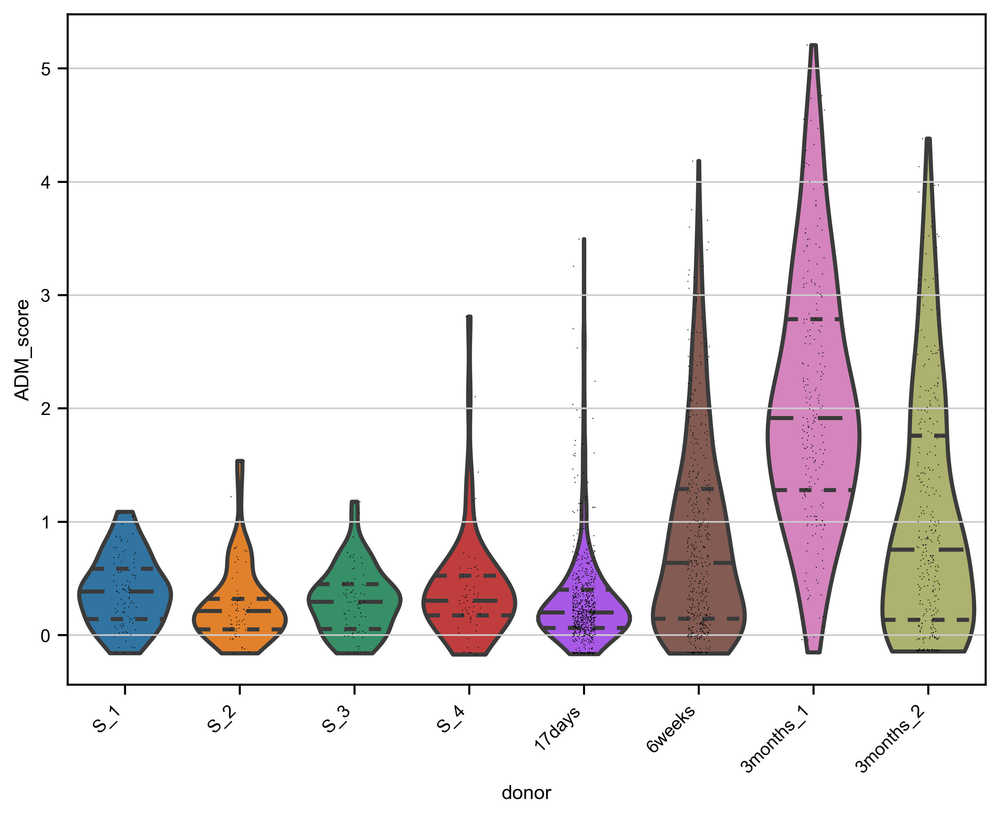

In [ ]:
sb.set_context('paper')
plt.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1) = plt.subplots(1, 1, figsize=(8,6), gridspec_kw={'wspace':0.2})

ax1_dict = sc.pl.violin(acinar, "ADM_score", groupby='donor', jitter=0.1, linewidth=2, alpha=0.25, inner="quartile",size=0.5, cut=0, ax=ax1, show=False)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right')

[Text(0, 0, 'Acinar')]

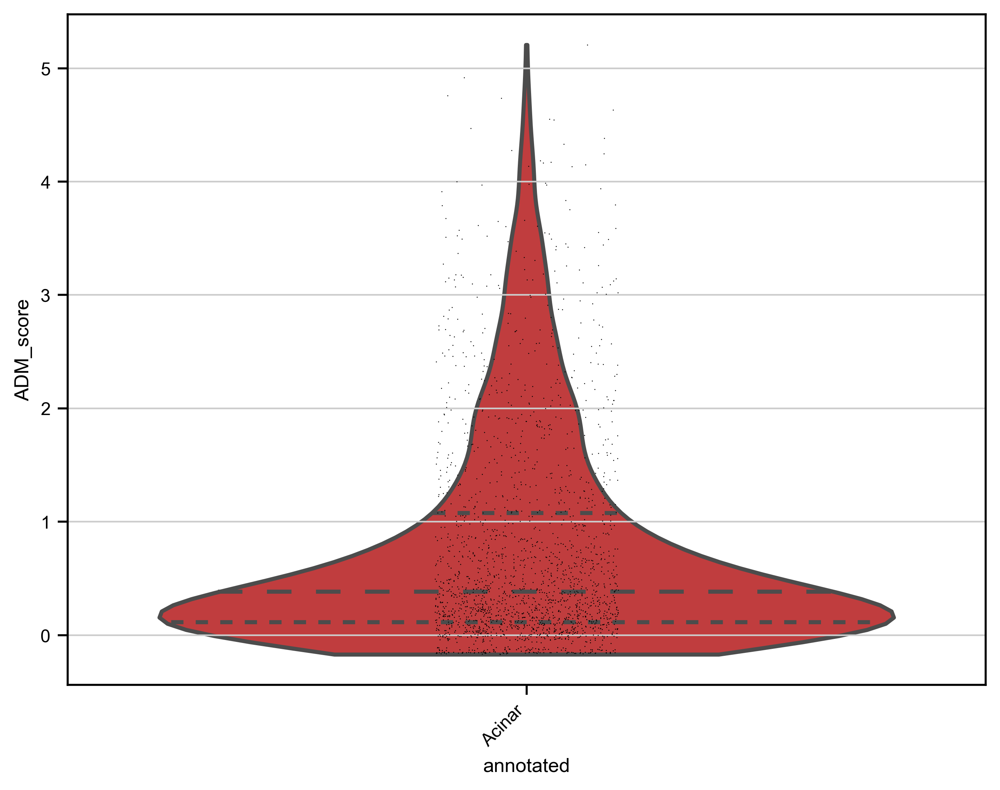

In [ ]:
sb.set_context('paper')
plt.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1) = plt.subplots(1, 1, figsize=(8,6), gridspec_kw={'wspace':0.2})

ax1_dict = sc.pl.violin(acinar, "ADM_score", groupby='annotated', jitter=0.1, linewidth=2, alpha=0.25, inner="quartile",size=0.5, cut=0, ax=ax1, show=False)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right')

Text(0.5, 0, '')

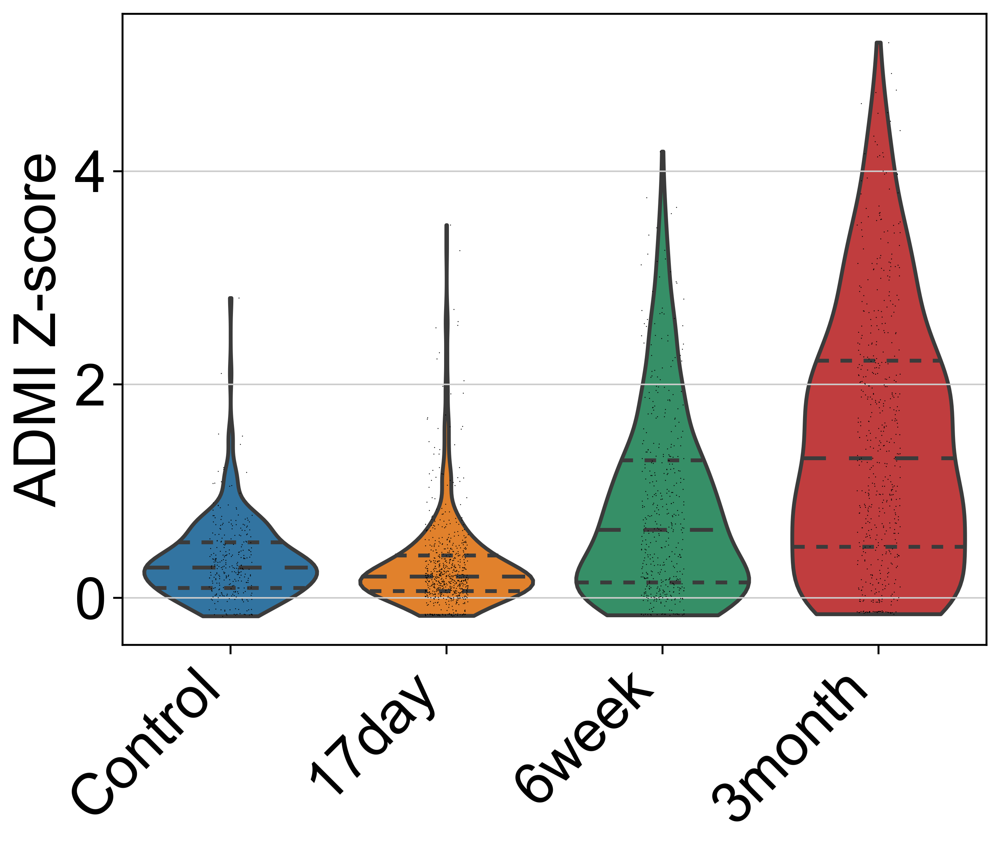

In [ ]:
sb.set_context('paper')
plt.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1) = plt.subplots(1, 1, figsize=(8,6), gridspec_kw={'wspace':0.2})

ax1_dict = sc.pl.violin(acinar, "ADM_score", groupby='condition', jitter=0.1, linewidth=2, alpha=0.25, inner="quartile",size=0.5, cut=0, ax=ax1, show=False)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right')
ax1.tick_params(axis='both', which='major', labelsize=30)
ax1.set_ylabel('ADMI Z-score',fontsize=30)
ax1.set_xlabel('')

In [ ]:
acinar = acinar[~acinar.obs['condition'].isin(['3month'])]
acinar

View of AnnData object with n_obs × n_vars = 1437 × 18500
    obs: 'sample', 'condition', 'donor', 'date', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'batch', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC', 'S_score', 'G2M_score', 'phase', 'leiden_r0.8', 'leiden_r0.5', 'leiden_r0.4', 'leiden_r0.3', 'leiden_r0.2', 'Ductal', 'Acinar', 'ADM', 'annotated', 'ADM_score'
    var: 'feature_type', 'id', 'mito', 'n_cells', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'triku_distance', 'triku_distance_uncorrected', 'triku_highly_variable'
    uns: 'QC_colors', 'annotated_